# VAR Model Class

This class is found in the app - but the purpose of this notebook was to understand train/test split and validate models + mass produce models for all the countries.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from sklearn.model_selection import train_test_split
from statsmodels.tsa.api import VAR
import matplotlib.dates as mdates
import pickle
from sklearn.metrics import mean_squared_error, r2_score

In [7]:
class VAR_model:
    def __init__(self, country_name, years):
        self.country_name = country_name
        self.years = years
        self.df = pd.read_csv('cleanedDF_modelling.csv')
        self.new_df = pd.DataFrame() #differenced df
        self.forecast_df = pd.DataFrame(index=pd.to_datetime([year for year in range(2019, 2019+self.years)],
                                                            errors='coerce', format='%Y'))
        self.mse_CO2 = 0
        self.r2_score_CO2 = 0
        self.mse_pop = 0
        self.r2_score_pop = 0
        self.mse_gdp = 0
        self.r2_score_gdp = 0
         
    def setup(self):
        self.df.rename(columns={"Unnamed: 0": "Year"}, inplace=True)
        self.df['Year'] = pd.to_datetime(self.df['Year'], errors='coerce', format='%Y')
        self.df.set_index('Year', inplace=True)
        self.df.sort_index(inplace=True)
        self.df = self.df.loc[(self.df.index < '2019') & (self.df.index > '1949')]
        self.df = self.df.filter(regex='^'+ str(self.country_name), axis=1)
        self.new_df = pd.DataFrame(index=self.df.index)
        self.stationary_columns()
        return self.df
    
    def stationary_columns(self):
        for col in self.df.columns:
            if adfuller(self.df[col])[1] < 0.01:
                self.new_df[col] = self.df[col]
            elif adfuller(self.df[col].diff(1).dropna())[1] < 0.01:
                self.new_df[str(col) + '_diff1'] = self.df[col].diff(1)
            elif adfuller(self.df[col].diff(1).diff(1).dropna())[1] < 0.01:
                self.new_df[str(col) +'_diff2'] = self.df[col].diff(1).diff(1)
            elif adfuller(self.df[col].diff(1).diff(1).diff(1).dropna())[1] < 0.01:
                self.new_df[str(col) +'_diff3'] = self.df[col].diff(1).diff(1).diff(1)
            elif adfuller(self.df[col].diff(1).diff(1).diff(1).diff(1).dropna())[1] < 0.01:
                self.new_df[str(col) +'_diff4'] = self.df[col].diff(1).diff(1).diff(1).diff(1)
            elif adfuller(self.df[col].diff(1).diff(1).diff(1).diff(1).diff(1).dropna())[1] < 0.01:
                self.new_df[str(col) +'_diff5'] = self.df[col].diff(1).diff(1).diff(1).diff(1).diff(1)
            else: 
                print(str(col) + '_need_diff')
                print(self.new_df.shape)
        self.new_df = self.new_df.dropna()
         
    
    def train_model_fit (self):
        steps = int(len(self.new_df)*0.75)
        train = self.new_df.iloc[0:steps]
        test = self.new_df.iloc[steps: len(self.new_df)]
        model = VAR(train)
        model_fit = model.fit(maxlags = 5, ic = 'aic')
        model_fit.plot_forecast(len(test));
        forecast = model_fit.forecast(y=train.values, steps = len(test))
        self.forecast_df = pd.DataFrame(forecast, index = test.index, columns = train.columns)
        
        print(self.forecast_df)
        
        for col in self.forecast_df:
            if 'CO2' in str(col):
                self.mse_CO2 = mean_squared_error(test[str(col)], self.forecast_df[col])
                self.r2_score_CO2 = r2_score(test[str(col)], self.forecast_df[col])
                print(f"mse_CO2: {self.mse_CO2}, r2_score_CO2: {self.r2_score_CO2}")
            if 'pop' in str(col):
                self.mse_pop = mean_squared_error(test[str(col)], self.forecast_df[col])
                self.r2_score_pop = r2_score(test[str(col)], self.forecast_df[col])
                print(f"mse_pop: {self.mse_pop}, r2_score_pop: {self.r2_score_pop}")
            if 'gdp' in str(col):
                self.mse_gdp = mean_squared_error(test[str(col)], self.forecast_df[col])
                self.r2_score_gdp = r2_score(test[str(col)], self.forecast_df[col])
                print(f"mse_gdp: {self.mse_gdp}, r2_score_gdp: {self.r2_score_gdp}")
        
        for col in self.new_df.columns:
            if '_diff5' in str(col):
                self.forecast_df[str(col) + '_4d_test'] = (self.df[str(col).rstrip('_diff5')].iloc[steps-4] - self.df[str(col).rstrip('_diff5')].iloc[steps-5])+ self.forecast_df[str(col)].cumsum()
                self.forecast_df[str(col) + '_forecast'] = self.df[str(col).rstrip('_diff5')].iloc[steps-1] + self.forecast_df[str(col)+'_4d_test'].cumsum()
            if '_diff4' in str(col):
                self.forecast_df[str(col) + '_3d_test'] = (self.df[str(col).rstrip('_diff4')].iloc[steps-3] - self.df[str(col).rstrip('_diff4')].iloc[steps-4])+ self.forecast_df[str(col)].cumsum()
                self.forecast_df[str(col) + '_forecast'] = self.df[str(col).rstrip('_diff4')].iloc[steps-1]  + self.forecast_df[str(col)+'_3d_test'].cumsum()
            if '_diff3' in str(col):
                self.forecast_df[str(col) + '_2d_test'] = (self.df[str(col).rstrip('_diff3')].iloc[steps-2] - self.df[str(col).rstrip('_diff3')].iloc[steps-3]) + self.forecast_df[str(col)].cumsum()
                self.forecast_df[str(col) + '_forecast'] = self.df[str(col).rstrip('_diff3')].iloc[steps-1]  + self.forecast_df[str(col)+'_2d_test'].cumsum()
            if '_diff2' in str(col):
                self.forecast_df[str(col) + '_1d_test'] = (self.df[str(col).rstrip('diff2').rstrip('_')].iloc[steps-1] - self.df[str(col).rstrip('diff2').rstrip('_')].iloc[steps-2]) + self.forecast_df[str(col)].cumsum()
                self.forecast_df[str(col) + '_forecast'] = self.df[str(col).rstrip('diff2').rstrip('_')].iloc[steps-1]  + self.forecast_df[str(col)+'_1d_test'].cumsum()
            if '_diff1' in str(col):
                self.forecast_df[str(col) + '_forecast'] = self.df[str(col).rstrip('_diff1')].iloc[steps-1] + self.forecast_df[str(col)].cumsum()
        

        
    def model_fit(self):
        model = VAR(self.new_df)
        model_fit = model.fit(maxlags= 5, ic='aic')
        forecast = model_fit.forecast(y=self.new_df.values, steps=self.years)
        self.forecast_df = pd.DataFrame(forecast, columns=self.new_df.columns, index = pd.to_datetime([year for year in range(2019, 2019+self.years)], 
                                                                                                      errors='coerce', format='%Y'))
        
        pickle.dump(model, open(f'{self.country_name}_VAR.p', 'wb'))
        
        self.invert_transformation()
        
    
    
    def invert_transformation (self):
        for col in self.new_df.columns:
            if "_diff5" in str(col):
                self.forecast_df[str(col)+'_4d'] = (self.df[str(col).rstrip('_diff5')].iloc[-4] - self.df[str(col).rstrip('_diff5')].iloc[-5]) + (self.forecast_df[str(col)].cumsum())
                self.forecast_df[str(col)+'_forecast'] = self.df[str(col).rstrip('_diff5')].iloc[-1] + self.forecast_df[str(col)+'_4d'].cumsum()          
            if "_diff4" in str(col):
                self.forecast_df[str(col)+'_3d'] = (self.df[str(col).rstrip('_diff4')].iloc[-3] - self.df[str(col).rstrip('_diff4')].iloc[-4]) + self.forecast_df[str(col)].cumsum()
                self.forecast_df[str(col)+'_forecast'] = self.df[str(col).rstrip('_diff4')].iloc[-1] + self.forecast_df[str(col)+'_3d'].cumsum()
            elif "_diff3" in str(col):
                self.forecast_df[str(col)+'_2d'] = (self.df[str(col).rstrip('_diff3')].iloc[-2] - self.df[str(col).rstrip('_diff3')].iloc[-3]) + self.forecast_df[str(col)].cumsum()
                self.forecast_df[str(col)+'_forecast'] = (self.df[str(col).rstrip('_diff3')].iloc[-1]) + self.forecast_df[str(col)+'_2d'].cumsum()
            elif "_diff2" in str(col):
                self.forecast_df[str(col)+'_1d'] = (self.df[str(col).rstrip('diff2').rstrip('_')].iloc[-1] - self.df[str(col).rstrip('diff2').rstrip('_')].iloc[-2]) + self.forecast_df[str(col)].cumsum()
                self.forecast_df[str(col)+'_forecast'] = (self.df[str(col).rstrip('diff2').rstrip('_')].iloc[-1]) + self.forecast_df[str(col)+'_1d'].cumsum()
            elif "_diff1" in str(col):
                self.forecast_df[str(col)+'_forecast'] = self.df[str(col).rstrip('_diff1')].iloc[-1] + self.forecast_df[str(col)].cumsum()
            else:
                self.forecast_df[str(col)+'_forecast'] = self.forecast_df[str(col)]
        return self.forecast_df
    
    def plot_results (self):
        #self.forecast_df = self.forecast_df.filter(regex='_forecast$')
        #self.forecast_df.columns = [f'{self.country_name}'+'_CO2', f'{self.country_name}'+'_pop', f'{self.country_name}'+'_gdp']
        fig, ax = plt.subplots (ncols =3, figsize = (15, 10))
        sns.lineplot(x = self.df.index.values, y= self.df[str(self.country_name)+'_CO2'], ax=ax[0])
        sns.lineplot(x = self.forecast_df.index.values, y = self.forecast_df[f'{self.country_name}'+'_CO2_diff1_forecast'], ax=ax[0])
        sns.lineplot(x = self.df.index.values, y= self.df[str(self.country_name)+'_pop'], ax=ax[1])
        sns.lineplot(x = self.forecast_df.index.values, y = self.forecast_df[f'{self.country_name}'+'_pop_diff2_forecast'], ax=ax[1])
        sns.lineplot(x = self.df.index.values, y= self.df[str(self.country_name)+'_gdp'], ax=ax[2])
        sns.lineplot(x = self.forecast_df.index.values, y = self.forecast_df[f'{self.country_name}'+'_gdp'], ax=ax[2])
        
        ax[0].set(xlabel='Date', ylabel ='CO2 Emissions', title = f'CO2 Emissions {self.country_name} (over time)')
        ax[1].set(xlabel='Date', ylabel ='Pop', title = f'Population {self.country_name} (over time)')
        ax[2].set(xlabel='Date', ylabel ='GDP Percentage', title = f'GDP Percentage {self.country_name} (over time)')
        ax[0].get_xaxis().set_major_locator(mdates.AutoDateLocator())
        ax[1].get_xaxis().set_major_locator(mdates.AutoDateLocator())
        ax[2].get_xaxis().set_major_locator(mdates.AutoDateLocator())
        
        
        plt.show();
                
    def __del__(self):
        print("removing model")
    

In [8]:
Canada2=VAR_model('Canada', 10)

In [9]:
Canada2.setup()

,Canada_CO2,Canada_pop,Canada_gdp
Year,,,
1950-01-01,154000.0,13700000,5.270
1951-01-01,163000.0,14100000,6.290
1952-01-01,160000.0,14400000,6.820
1953-01-01,161000.0,14800000,4.670
1954-01-01,163000.0,15200000,-0.952
...,...,...,...
2014-01-01,578000.0,35700000,0.000
2015-01-01,577000.0,36000000,0.000
2016-01-01,565000.0,36400000,0.000


/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Canada_CO2_diff1  Canada_pop_diff2  Canada_gdp
Year                                                      
2002-01-01       5454.779867       5512.980034    2.683938
2003-01-01       7183.409633      -4378.319121    3.447950
2004-01-01       7840.015248       1915.042552    3.660996
2005-01-01       8060.369230      -2577.073724    3.727572
2006-01-01       8110.349339        396.786908    3.749099
2007-01-01       8138.849312      -1635.512227    3.755111
2008-01-01       8138.870943       -267.189348    3.757436
2009-01-01       8144.849451      -1194.743610    3.757847
2010-01-01       8142.665355       -567.936009    3.758185
2011-01-01       8144.720035       -992.116753    3.758147
2012-01-01       8143.509374       -705.248631    3.758232
2013-01-01       8144.383912       -899.312442    3.758193
2014-01-01       8143.809612       -768.048107    3.758225
2015-01-01       8144.203442       -856.840651    3.758205
2016-01-01       8143.938707       -796.779506    3.7582

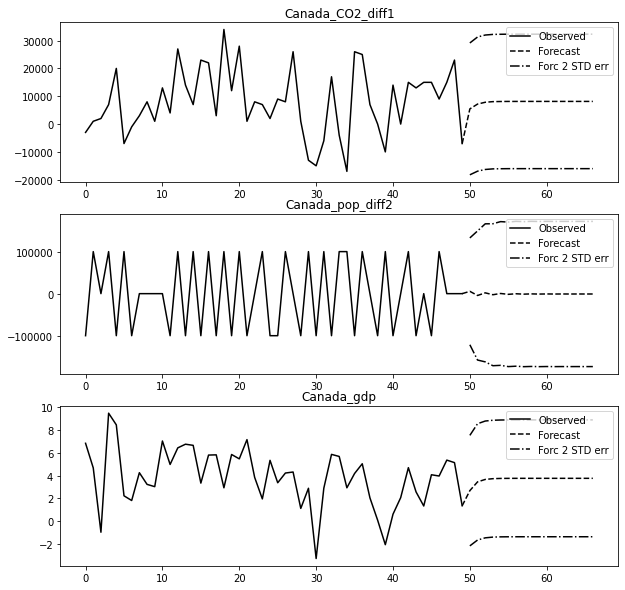

In [10]:
Canada2.train_model_fit()

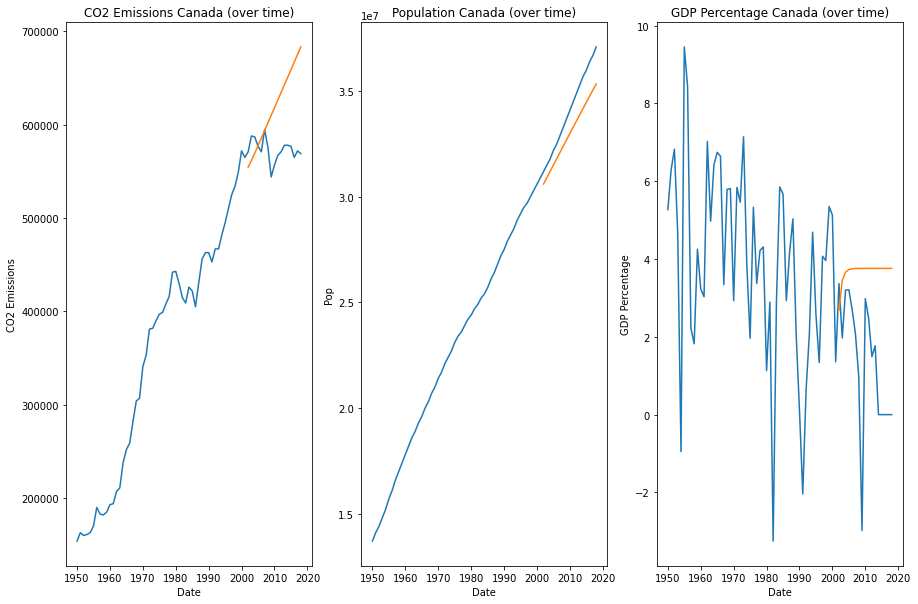

In [11]:
Canada2.plot_results()

In [12]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


In [13]:
country_df = pd.read_csv('cleanedDF_modelling.csv')
country_df = country_df.filter(regex='CO2$', axis=1)
country_df.columns = country_df.columns.str.rstrip('_CO2')
country_list = [col for col in country_df.columns]
countries = pd.DataFrame([country_list]).T
countries.rename(columns = {0: 'country_names'}, inplace=True)

In [14]:
#Setting up empty columns
countries['mse_CO2'] = 0
countries['r2_score_CO2'] = 0
countries['mse_pop'] = 0
countries['r2_score_pop'] = 0
countries['mse_gdp'] = 0
countries['r2_score_gdp'] = 0



In [15]:
countries = countries.set_index('country_names')

In [16]:
countries

,mse_CO2,r2_score_CO2,mse_pop,r2_score_pop,mse_gdp,r2_score_gdp
country_names,,,,,,
Afghanistan,0,0,0,0,0,0
Albania,0,0,0,0,0,0
Algeria,0,0,0,0,0,0
Andorra,0,0,0,0,0,0
Angola,0,0,0,0,0,0
Antigua and Barbuda,0,0,0,0,0,0
Argentina,0,0,0,0,0,0
Armenia,0,0,0,0,0,0
Australia,0,0,0,0,0,0


/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Afghanistan_CO2_diff1  Afghanistan_pop_diff2  Afghanistan_gdp
Year                                                                     
2002-01-01            -369.840981          247600.389272        -6.619986
2003-01-01            -117.992388           93240.064788         4.999488
2004-01-01             -75.162861          137247.809762         0.281099
2005-01-01            -182.504167          -14337.342171         5.198597
2006-01-01             -70.408839          -65017.219413         7.260818
2007-01-01             -33.037538          -84364.781657         3.940110
2008-01-01              81.339549         -156738.087020         8.198325
2009-01-01              87.572771          -84987.186870         4.771459
2010-01-01              75.139090          -70827.366270         3.039945
2011-01-01             118.016475          -14537.362317         1.522529
2012-01-01              59.400410           58006.731269        -1.482201
2013-01-01              36.232726     

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Albania_CO2_diff1  Albania_pop_diff2  Albania_gdp
Year                                                         
2002-01-01        -948.456940      -11086.879305    -9.465539
2003-01-01       -1059.652548      -19105.075944    -6.543922
2004-01-01         591.525507       -3662.249542     7.791231
2005-01-01        -247.832589       -7448.449415     4.845240
2006-01-01         345.242731        5300.147726     8.783501
2007-01-01        -213.920904        7570.421799     4.166250
2008-01-01        -399.852575        7278.928092    -3.036328
2009-01-01         514.473099        3617.906120     6.847716
2010-01-01         612.678076        4842.901283     9.558244
2011-01-01          60.638532       -3788.001716     4.707992
2012-01-01         245.401205       -2141.958708     4.897898
2013-01-01        -656.264705       -8726.040832    -2.923345
2014-01-01        -358.498821       -8692.086690    -2.208864
2015-01-01         209.600255       -6032.098714     6.094657
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Algeria_CO2_diff1  Algeria_pop_diff3  Algeria_gdp_diff1
Year                                                               
2002-01-01        2547.061134     -197924.238353           6.129614
2003-01-01        2010.008276       32792.865920          -6.178227
2004-01-01        7992.577330      159706.383584           4.085107
2005-01-01        -355.257929     -213201.822206          -0.341958
2006-01-01        3149.502779      175242.371922          -5.673099
2007-01-01       -1566.511853      -63819.482843           4.901195
2008-01-01         937.255613      -67702.019483          -0.083696
2009-01-01        4854.353547      106410.808524          -0.137768
2010-01-01         966.799494      -64600.752642          -1.530591
2011-01-01        2476.797507      -16607.123259           0.613149
2012-01-01        2428.500035       88939.913873          -1.481165
2013-01-01        -273.665052      -97214.879775           3.299006
2014-01-01        2645.612401       33472.963728

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Andorra_CO2_diff1  Andorra_pop_diff2  Andorra_gdp_diff1
Year                                                               
2002-01-01          17.806495         791.799720          -1.724974
2003-01-01          -8.593745         641.708512           4.926549
2004-01-01         181.096445         303.595899          -3.959310
2005-01-01         150.630897           1.608831           4.573790
2006-01-01         161.626536        -434.606078          -7.699485
2007-01-01          45.972012        -710.828683          -0.571131
2008-01-01          49.554125       -1021.533548          -6.311638
2009-01-01         -35.600339       -1157.547616           1.999999
2010-01-01         -46.412760       -1061.253652          -4.793264
2011-01-01        -116.957098        -665.723111           2.359935
2012-01-01         -80.936472         -99.253044          -2.129117
2013-01-01         -91.115622         590.860948           5.573451
2014-01-01         -44.509643        1212.704127

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Angola_CO2_diff1  Angola_pop_diff2  Angola_gdp
Year                                                      
2002-01-01        972.385202      26665.420547    4.726913
2003-01-01        206.353538      43054.747604    5.220359
2004-01-01       -238.239012      17443.256106    0.247597
2005-01-01        -48.264025       1436.555184   -0.597524
2006-01-01        758.843533       9947.069701    2.865236
2007-01-01        473.767733      20478.691095    3.998420
2008-01-01       -201.345645      11035.952152    1.403088
2009-01-01       -168.470486       3936.844707    1.060150
2010-01-01        445.028582       8057.136704    2.505542
2011-01-01        399.424506      11669.246379    3.096693
2012-01-01         16.323861       6831.214990    2.681327
2013-01-01        106.849749       5908.819854    2.927475
2014-01-01        365.215636      10628.270085    3.533800
2015-01-01        216.121250      12032.953381    3.446110
2016-01-01         49.052086       7888.068648    2.7124

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


removing model


/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Argentina_CO2_diff2  Argentina_pop_diff2  Argentina_gdp
Year                                                               
2002-01-01          8612.847095         36165.830837       3.045436
2003-01-01          -784.309240         -7932.230216       6.984928
2004-01-01         -3949.860801        -30066.711665       1.440452
2005-01-01           865.320207         29345.444505       0.614087
2006-01-01          1557.052535           738.880197       3.975895
2007-01-01          -602.793015        -11274.420117       3.216661
2008-01-01         -1156.170703          7116.803141       2.018764
2009-01-01           471.396758          1104.856862       2.482461
2010-01-01           407.574053          1848.376697       2.980935
2011-01-01          -620.056407          -543.230366       2.795666
2012-01-01          -180.741958           222.043149       2.410378
2013-01-01           158.904758          3741.805736       2.663795
2014-01-01          -118.263761          -418.23

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Armenia_CO2_diff1  Armenia_pop_diff2  Armenia_gdp
Year                                                         
2002-01-01        1459.060391        3779.792561     6.792344
2003-01-01         244.851513        -459.515589     4.202766
2004-01-01         208.477005        -686.170514     3.513285
2005-01-01          79.370733       -1147.825100     3.150976
2006-01-01          57.404071       -1235.481286     3.030083
2007-01-01          41.286834       -1294.258348     2.976594
2008-01-01          36.822341       -1311.274560     2.956950
2009-01-01          34.577163       -1319.559664     2.948828
2010-01-01          33.815321       -1322.424510     2.945721
2011-01-01          33.483395       -1323.656621     2.944472
2012-01-01          33.360577       -1324.116193     2.943985
2013-01-01          33.310102       -1324.304062     2.943792
2014-01-01          33.290727       -1324.376421     2.943716
2015-01-01          33.282954       -1324.405383     2.943686
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Australia_CO2_diff1  Australia_pop_diff2  Australia_gdp_diff1
Year                                                                     
2002-01-01          6388.775136          3542.408746            -0.176818
2003-01-01          6142.448879          1118.981893            -1.063094
2004-01-01          5994.342473         -6067.913371             0.510432
2005-01-01          6326.376631          3797.663254             0.214586
2006-01-01          6216.797818          1010.327486            -0.377636
2007-01-01          6125.478388         -2302.196836             0.043541
2008-01-01          6211.652938           961.319131             0.105405
2009-01-01          6215.874981           591.332115            -0.112268
2010-01-01          6172.909624          -554.423771            -0.033639
2011-01-01          6193.012157           121.130630             0.023297
2012-01-01          6201.663851           306.972659            -0.037842
2013-01-01          6188.957469       

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Austria_CO2_diff1  Austria_pop_diff2  Austria_gdp_diff1
Year                                                               
2002-01-01        1204.059151        4124.533681           0.636571
2003-01-01        -596.785573        3040.263106          -0.218938
2004-01-01        1611.974583        1560.854522          -0.308685
2005-01-01        1421.384272        1576.920552           0.429814
2006-01-01         659.203302        1045.396952          -0.309276
2007-01-01        1157.138821         734.856645          -0.228783
2008-01-01         970.317196         492.497231           0.166595
2009-01-01         864.440128         498.382073          -0.114585
2010-01-01        1105.069697         426.447992          -0.103580
2011-01-01         977.430007         391.253694           0.012223
2012-01-01         922.671312         360.308922          -0.087015
2013-01-01        1020.693219         343.893601          -0.060367
2014-01-01         977.930982         339.280485

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Azerbaijan_CO2_diff1  Azerbaijan_pop_diff3  Azerbaijan_gdp_diff1
Year                                                                        
2002-01-01           2925.428192            -35.211222             -1.424773
2003-01-01            821.987518           1657.692950             -6.018275
2004-01-01           1732.236234            467.457453             -1.736911
2005-01-01          -1107.227238          -3513.156530             -4.063304
2006-01-01          -1139.725544            917.669368              5.604784
2007-01-01           -424.061564          -5859.170211             -1.518402
2008-01-01             33.612458           3633.306394              4.080595
2009-01-01            296.553281          -5665.151081             -1.776155
2010-01-01           -348.219401           8071.981100              2.554738
2011-01-01            106.029424          -5190.273196             -0.832060
2012-01-01             20.813915           6530.487911              2.531664

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Bahamas_CO2_diff1  Bahamas_pop_diff1  Bahamas_gdp
Year                                                         
2002-01-01         279.448472        4857.398824     5.211257
2003-01-01       -1380.755233        4897.177417     7.230095
2004-01-01          62.330006        5028.923884     8.770105
2005-01-01        -617.249814        4944.508915     4.538294
2006-01-01        -424.175470        5015.809532     5.904876
2007-01-01         185.475313        5058.239547     6.346489
2008-01-01         206.290734        4950.430364     5.403946
2009-01-01          -9.964323        4885.120099     5.678052
2010-01-01         374.292658        4862.955324     5.247404
2011-01-01         226.075842        4779.682898     3.700213
2012-01-01         116.638614        4736.865878     3.703717
2013-01-01         299.189226        4716.592453     3.708750
2014-01-01         188.321085        4651.318717     3.238607
2015-01-01          85.267031        4618.539014     3.541877
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


removing model


/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Bangladesh_CO2_diff3  Bangladesh_pop_diff2  Bangladesh_gdp
Year                                                                  
2002-01-01          -3814.714483         857436.892537        3.593252
2003-01-01           3235.387172        -849609.656984        2.925825
2004-01-01          -2204.054151         737290.846851        3.624703
2005-01-01           1908.508137        -590967.868023        2.074182
2006-01-01          -1623.193546         442325.006609        4.347360
2007-01-01           1365.712377        -266817.033715        2.908589
2008-01-01           -831.899915         234779.746838        4.009836
2009-01-01            542.573281        -129745.244146        3.146509
2010-01-01           -317.697240         133875.647164        4.142584
2011-01-01            319.235032         -38165.278929        3.322193
2012-01-01           -174.141283          65674.517584        3.822904
2013-01-01            149.179469          -2485.088064        3.573163
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


removing model


/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Belarus_CO2_diff1   Belarus_pop  Belarus_gdp
Year                                                    
2002-01-01       -2139.571551  9.767377e+06     4.692587
2003-01-01       -2626.755835  9.725720e+06     3.618653
2004-01-01       -2214.738013  9.698247e+06     2.569630
2005-01-01       -2288.624683  9.660798e+06     2.441168
2006-01-01       -2713.865360  9.634022e+06     2.225229
2007-01-01       -2334.072392  9.607428e+06     2.204181
2008-01-01       -2153.242046  9.585856e+06     2.113690
2009-01-01       -2157.627764  9.563863e+06     2.228750
2010-01-01       -2089.116671  9.547278e+06     2.174478
2011-01-01       -1877.647272  9.531634e+06     2.205291
2012-01-01       -1815.417470  9.518870e+06     2.208253
2013-01-01       -1745.682789  9.507659e+06     2.248284
2014-01-01       -1643.094615  9.499204e+06     2.237825
2015-01-01       -1548.287554  9.492041e+06     2.260000
2016-01-01       -1498.906801  9.486877e+06     2.264135
2017-01-01       -1432.951084  

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Belgium_CO2_diff1  Belgium_pop_diff2  Belgium_gdp_diff1
Year                                                               
2002-01-01         922.409135      -52107.540563           3.399308
2003-01-01        3016.650149       40166.761415          -2.384278
2004-01-01       -3745.272838       74273.558947           2.462169
2005-01-01         915.444790      -41829.164699          -2.346351
2006-01-01         686.686021       13633.226881           1.121815
2007-01-01        3122.254946      -99359.505674          -0.014395
2008-01-01        3305.626842       48239.435521          -0.472918
2009-01-01       -2635.865615       20566.546931           1.011656
2010-01-01         924.713329       34147.409062          -1.443932
2011-01-01       -2782.215204        4757.133060           1.112333
2012-01-01        4204.887906      -82788.631442          -0.798242
2013-01-01        1766.926248       16830.270781           0.496812
2014-01-01        1345.200857      -18248.023549

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Belize_CO2_diff1  Belize_pop_diff2  Belize_gdp
Year                                                      
2002-01-01        -37.168633       -316.730587   13.201657
2003-01-01         79.861261       -456.545563   11.131642
2004-01-01         21.686370      -1045.069323    4.641737
2005-01-01        -38.814958        775.722150    9.832369
2006-01-01         37.776175        245.358657    8.543038
2007-01-01         20.249727       -308.515847   -1.082699
2008-01-01        -59.986078       1391.713469    4.615759
2009-01-01         29.249078        566.852149    5.277036
2010-01-01         24.841547       -213.736428   -1.518892
2011-01-01        -44.660240       1144.065857    5.160475
2012-01-01         28.234111        180.868526    9.266276
2013-01-01         51.099735       -648.887531    2.629391
2014-01-01        -36.462329        407.875096    8.321906
2015-01-01         31.779651         13.647771   12.103299
2016-01-01         55.450599       -929.658113    4.2377

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Benin_CO2_diff2  Benin_pop_diff2  Benin_gdp
Year                                                   
2002-01-01      -166.084765     -5157.286312   3.854730
2003-01-01       -25.203477     16813.248339   1.393678
2004-01-01       210.644949     -7655.020313   4.768795
2005-01-01      -125.840827     10977.212287   2.576414
2006-01-01        46.312468      5315.801741   4.993559
2007-01-01       -14.699482      -444.635752   3.469241
2008-01-01       -79.670830      6249.490795   2.119890
2009-01-01       118.119477      3795.612777   3.958939
2010-01-01       -43.633449      2369.745207   2.750809
2011-01-01        14.720324      7239.679421   3.851468
2012-01-01         2.041891      1999.662282   3.653037
2013-01-01       -36.230802      4196.944356   2.662163
2014-01-01        38.327861      4451.906292   3.536203
2015-01-01        -3.334523      3402.130067   3.009917
2016-01-01         4.845873      4774.982663   3.438104
2017-01-01         2.916199      4103.715415   3

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Bhutan_CO2_diff2  Bhutan_pop_diff2  Bhutan_gdp
Year                                                      
2002-01-01         33.746706      -3456.818919   14.355149
2003-01-01         28.096950      -1260.496722    3.034234
2004-01-01        -98.526283      -3415.839416    1.998380
2005-01-01         78.733497      -1165.859596    7.787835
2006-01-01          1.069404        129.402205    3.830198
2007-01-01        -17.342885        952.778386    4.108062
2008-01-01         28.030701       1547.452502    9.425525
2009-01-01         -7.109469       2256.699209    3.806276
2010-01-01        -38.175995       1458.449097    6.350267
2011-01-01         45.824041        934.214301   11.025655
2012-01-01         -8.747927        271.316882    5.457784
2013-01-01        -28.981508      -1237.479660    6.486517
2014-01-01         24.449428      -1648.305055    7.647268
2015-01-01        -11.431017      -1508.675720    3.587554
2016-01-01         -9.487497      -1416.562699    5.1637

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Bolivia_CO2_diff2  Bolivia_pop_diff2  Bolivia_gdp_diff1
Year                                                               
2002-01-01        2625.890161        1945.938519          -3.692882
2003-01-01       -1466.562740        -940.236840           4.383575
2004-01-01         161.912561        9699.632800          -1.488356
2005-01-01         655.670617       -5797.340877          -1.051667
2006-01-01        -942.263777        7606.215775           1.784113
2007-01-01         667.325048         670.668322          -0.938242
2008-01-01        -260.834008        1232.649190           0.252712
2009-01-01        -149.217273        4324.141309           0.168259
2010-01-01         283.600581         471.618823          -0.119195
2011-01-01        -296.523975        3268.009977           0.267774
2012-01-01         132.998040        2165.154802          -0.188441
2013-01-01         -31.479516        1784.899720           0.211948
2014-01-01         -93.334799        2971.160448

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Bosnia and Herzegovina_CO2_diff1  \
Year                                           
2002-01-01                         94.377593   
2003-01-01                       1464.083569   
2004-01-01                       -191.096066   
2005-01-01                       -855.109586   
2006-01-01                       -427.723190   
2007-01-01                      -1385.087713   
2008-01-01                        -44.534060   
2009-01-01                         30.529501   
2010-01-01                        374.054332   
2011-01-01                        849.337687   
2012-01-01                        710.271411   
2013-01-01                        617.722267   
2014-01-01                        715.532490   
2015-01-01                        437.423322   
2016-01-01                        404.498769   
2017-01-01                        244.549782   
2018-01-01                         43.869312   

            Bosnia and Herzegovina_pop_diff2  Bosnia and Herzegovina_gdp  
Year        

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Botswana_CO2_diff1  Botswana_pop_diff2  Botswana_gdp_diff1
Year                                                                  
2002-01-01          134.971925        -9704.434040           -3.907889
2003-01-01           58.535838         5904.642832           -0.261877
2004-01-01         -375.571355       -10635.668445            4.009828
2005-01-01           73.905999        11134.542908            3.871837
2006-01-01         -200.085810        -3100.417199            0.634158
2007-01-01         -231.516164          562.785007            2.213391
2008-01-01          224.899630         4616.687493           -1.387858
2009-01-01         -169.498943        -2327.664334            2.227982
2010-01-01          365.594905         2229.940242           -2.285853
2011-01-01           37.255219          148.188033            1.167540
2012-01-01           91.072440        -5230.240524           -1.346406
2013-01-01          292.725597         6537.600745           -0.369681
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)
/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/vector_ar/plotting.py:63: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10, 10))


            Brazil_CO2_diff2    Brazil_pop  Brazil_gdp_diff1
Year                                                        
2002-01-01       6801.482942  1.798935e+08          3.878550
2003-01-01       -689.771117  1.823983e+08         -1.086723
2004-01-01        531.120955  1.851032e+08          3.431688
2005-01-01      -1419.116769  1.877278e+08         -2.464610
2006-01-01       2468.704242  1.902073e+08          1.330546
2007-01-01        238.760475  1.929285e+08         -0.219739
2008-01-01       1520.658388  1.954685e+08          1.619199
2009-01-01        766.352291  1.981971e+08          0.728129
2010-01-01       1511.157052  2.007793e+08          0.273463
2011-01-01       1352.063867  2.034824e+08          0.938480
2012-01-01        552.205713  2.061166e+08          0.315408
2013-01-01       1098.470503  2.087951e+08          1.081349
2014-01-01        912.861784  2.114486e+08          0.347155
2015-01-01       1584.021664  2.141170e+08          0.999857
2016-01-01       1164.70

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Brunei_CO2_diff1  Brunei_pop_diff2  Brunei_gdp_diff1
Year                                                            
2002-01-01        106.978103        162.478369         -0.682781
2003-01-01         38.531122         43.992673          0.610136
2004-01-01        132.950369         95.456332         -0.358650
2005-01-01         64.163485         81.532919         -0.286341
2006-01-01         76.034747         82.780925          0.124997
2007-01-01         98.329816         85.920931         -0.130829
2008-01-01         84.034986         81.166332         -0.208848
2009-01-01         77.768688         84.677793         -0.030389
2010-01-01         89.896214         84.065113         -0.084609
2011-01-01         86.404703         82.741177         -0.152617
2012-01-01         81.673242         83.947321         -0.085594
2013-01-01         86.258632         83.838124         -0.084904
2014-01-01         86.298869         83.324785         -0.122453
2015-01-01         83.749

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Bulgaria_CO2_diff1  Bulgaria_pop_diff3  Bulgaria_gdp
Year                                                            
2002-01-01         4041.595116         4918.193318      6.191464
2003-01-01         4893.885692         4781.440458      4.419544
2004-01-01         3432.428488        -3274.127430      3.726774
2005-01-01         2282.576688        -1965.417708      3.197828
2006-01-01           84.511236           75.384423      3.406365
2007-01-01          317.041912        -2751.943647      3.272387
2008-01-01         1531.473646         -270.766298      3.061076
2009-01-01         1793.001169          163.018285      3.437559
2010-01-01         1654.133883         1426.743570      3.415043
2011-01-01         1895.698210         -419.122831      2.950894
2012-01-01         1628.620187         -557.005076      2.857537
2013-01-01         1165.913258         -126.308790      2.886831
2014-01-01          840.109909         -135.477799      2.853220
2015-01-01         1134.1

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Burkina Faso_CO2_diff2  Burkina Faso_pop_diff3  Burkina Faso_gdp
Year                                                                        
2002-01-01              151.529125             1901.006679          5.833951
2003-01-01              -78.656418            -2811.067925          3.520949
2004-01-01               25.745845             -601.587053          2.821273
2005-01-01              -11.763995             4692.387985          4.089998
2006-01-01               17.639260            -5740.056600          3.732264
2007-01-01              -11.265579             3313.103440          3.478742
2008-01-01                1.551665             -199.121292          3.579949
2009-01-01                9.123086            -1674.597558          3.833782
2010-01-01               -7.263804             1659.285376          3.499790
2011-01-01                4.479053             -861.534710          3.648704
2012-01-01                2.231128              -35.320141          3.706601

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Burundi_CO2_diff2  Burundi_pop_diff2  Burundi_gdp
Year                                                         
2002-01-01          85.741868       23957.887493     7.064484
2003-01-01         -67.895729       36993.054729    10.613884
2004-01-01          30.735439       13712.242518     4.822216
2005-01-01          -4.762208       27462.449890     7.144649
2006-01-01         -17.132571       12265.484642     4.140611
2007-01-01          21.182905       17827.271379     5.813780
2008-01-01         -21.794419       13239.425803     4.496707
2009-01-01          12.730137       11457.576550     4.438848
2010-01-01          -7.248843       12410.724210     4.484346
2011-01-01          -0.938311        9099.088447     3.895267
2012-01-01           2.602701       10248.301419     4.169729
2013-01-01          -5.532722        8588.937196     3.780177
2014-01-01           3.155794        8353.566405     3.812567
2015-01-01          -3.355738        8232.395399     3.744117
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Cambodia_CO2_diff2  Cambodia_pop_diff3  Cambodia_gdp_diff1
Year                                                                  
2002-01-01         -229.884513        13863.225454            2.245048
2003-01-01           61.267716       -26065.704026           -1.899167
2004-01-01           25.784095         1342.405487            3.651722
2005-01-01           70.973707        43654.502406           -5.682488
2006-01-01            7.310893        -4299.198290            0.199045
2007-01-01          -80.575761        29495.752371            3.623288
2008-01-01           -1.556725        -2750.611059           -4.846695
2009-01-01          -38.866191       -15619.898000            2.286281
2010-01-01           80.475661          806.691053            0.929646
2011-01-01            0.847445       -29657.526305           -0.489342
2012-01-01          -58.550901        -5598.569458            1.682703
2013-01-01           84.087084        -1638.729800           -0.868175
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Cameroon_CO2_diff1  Cameroon_pop_diff2  Cameroon_gdp_diff1
Year                                                                  
2002-01-01         2811.502656        37514.290904           -7.028937
2003-01-01        -3023.375043        20243.111956            6.530667
2004-01-01         1505.429414       -73345.168846           -3.569250
2005-01-01        -1791.279785       130678.184607            1.824504
2006-01-01         1255.993077       -84977.961210           -5.610113
2007-01-01         -220.744960        33998.386443            2.098375
2008-01-01          107.114980        35593.202440           -0.183997
2009-01-01          227.210454       -28413.505271           -0.709927
2010-01-01        -1091.317368        18640.612365            1.797182
2011-01-01          665.456480         5801.289882           -1.829744
2012-01-01          446.596373        22339.878631           -0.717191
2013-01-01         -139.348961       -16401.130827            1.190894
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Canada_CO2_diff1  Canada_pop_diff2  Canada_gdp
Year                                                      
2002-01-01       5454.779867       5512.980034    2.683938
2003-01-01       7183.409633      -4378.319121    3.447950
2004-01-01       7840.015248       1915.042552    3.660996
2005-01-01       8060.369230      -2577.073724    3.727572
2006-01-01       8110.349339        396.786908    3.749099
2007-01-01       8138.849312      -1635.512227    3.755111
2008-01-01       8138.870943       -267.189348    3.757436
2009-01-01       8144.849451      -1194.743610    3.757847
2010-01-01       8142.665355       -567.936009    3.758185
2011-01-01       8144.720035       -992.116753    3.758147
2012-01-01       8143.509374       -705.248631    3.758232
2013-01-01       8144.383912       -899.312442    3.758193
2014-01-01       8143.809612       -768.048107    3.758225
2015-01-01       8144.203442       -856.840651    3.758205
2016-01-01       8143.938707       -796.779506    3.7582

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Cape Verde_CO2_diff1  Cape Verde_pop_diff2  Cape Verde_gdp
Year                                                                  
2002-01-01             -5.837879            900.664496       10.245837
2003-01-01             -7.809941           1050.067345        6.504392
2004-01-01              5.554279           2081.975352       11.882356
2005-01-01             -3.596300           1545.634462        8.416299
2006-01-01             -1.980569           1697.449426       11.866049
2007-01-01             -2.811903           1223.421079        9.950436
2008-01-01             -4.415517            520.725337        8.707376
2009-01-01             -4.913879            118.315447        9.777194
2010-01-01             -0.008089           -261.584082        6.653462
2011-01-01             -0.361631           -622.889168        6.894567
2012-01-01             -1.503599           -576.864673        5.124850
2013-01-01              6.100564           -577.657745        3.859592
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


removing model


/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Chad_CO2_diff1  Chad_pop_diff3  Chad_gdp
Year                                                
2002-01-01       22.692899     8770.971166 -2.527009
2003-01-01       17.660354     1236.314510  6.658081
2004-01-01       -9.061090    -2052.287874  1.951703
2005-01-01       22.264732      167.964835  0.931547
2006-01-01        3.609190     1571.342495  2.123377
2007-01-01       10.455476     1044.516982  3.443805
2008-01-01       13.011129    -2022.276888  2.093140
2009-01-01       14.756142     2433.876460  2.024516
2010-01-01        6.854963     -517.644774  3.227881
2011-01-01       11.283948      373.985137  2.025248
2012-01-01       12.400993      248.530450  2.279422
2013-01-01        9.361470      827.301904  2.526445
2014-01-01       10.948034     -121.671970  2.552349
2015-01-01       11.679238      448.299455  2.209019
2016-01-01       10.852568      515.503725  2.530134
2017-01-01       10.237876      186.546161  2.472199
2018-01-01       11.447282      349.568077  2.

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Chile_CO2_diff3  Chile_pop_diff2  Chile_gdp
Year                                                   
2002-01-01      1031.375973    -35156.252712   2.075370
2003-01-01     -2476.280517    -36269.816388   3.434984
2004-01-01      1586.383271     73794.005417   5.703464
2005-01-01      -438.202944    -52613.409669   2.692193
2006-01-01      -661.211829      9993.778193   4.446541
2007-01-01       795.658703     13826.196169   4.829751
2008-01-01      -508.990910    -11557.460129   3.199403
2009-01-01       -95.732488      3028.194916   4.538696
2010-01-01        75.706372      3155.145712   4.287181
2011-01-01       -90.908704     -4694.157739   3.809653
2012-01-01       -98.122981      4119.155836   4.297883
2013-01-01       -36.872290      -768.793933   4.121873
2014-01-01       -85.919636      -524.608730   4.059730
2015-01-01       -46.788595       581.034325   4.194126
2016-01-01       -62.897066       766.137357   4.101057
2017-01-01       -68.967625      -282.418821   4

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            China_CO2_diff2  China_pop_diff3  China_gdp
Year                                                   
2002-01-01    -59283.340039    -9.541412e+05   5.576116
2003-01-01    -19172.377126     1.064015e+06   3.539109
2004-01-01     19851.659516    -4.561385e+05   4.065842
2005-01-01     19517.276013     1.460147e+05   6.612655
2006-01-01      4963.268821    -2.608429e+04   7.680841
2007-01-01    -10288.517969     5.939444e+04   6.057586
2008-01-01     -7450.989882    -1.350619e+04   4.891923
2009-01-01      -472.030890     7.053307e+04   4.907244
2010-01-01      5631.586440    -2.014757e+04   5.780592
2011-01-01      3668.003922     2.284057e+04   6.263490
2012-01-01       -58.169918     4.781231e+04   6.089007
2013-01-01     -2636.029540    -2.767687e+03   5.622957
2014-01-01     -1251.153517     3.857869e+04   5.474350
2015-01-01       940.507447     1.095702e+04   5.624506
2016-01-01      1699.891523     2.557716e+04   5.831909
2017-01-01       839.415675     1.884600e+04   5

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Colombia_CO2_diff1  Colombia_pop_diff2  Colombia_gdp
Year                                                            
2002-01-01         -192.947838      -115117.465883      4.249520
2003-01-01       -12536.436856        64786.648249     -2.857611
2004-01-01         3830.029944      -126564.806608      1.047518
2005-01-01         -608.159146       128560.039921      0.135004
2006-01-01         -640.513519       -78384.381037     -1.248903
2007-01-01       -12708.107502        24058.190048     -2.704473
2008-01-01         3430.998861       -33917.563857      0.707554
2009-01-01        -1783.048032         7985.536353      1.608924
2010-01-01        -2376.890341          850.580047     -0.504111
2011-01-01       -11919.628395       -61547.130020     -3.889339
2012-01-01         3701.062334        35350.559662      0.367856
2013-01-01        -3175.568708       -28792.248279     -1.603345
2014-01-01        -3322.927793        11967.517044     -1.131249
2015-01-01       -12026.8

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Comoros_CO2_diff1  Comoros_pop_diff2  Comoros_gdp_diff1
Year                                                               
2002-01-01          -2.650282         -68.489802          -0.798751
2003-01-01           3.845214         266.249571          -0.588790
2004-01-01           3.244441         355.700641           0.570817
2005-01-01           1.226959         216.628040          -0.155556
2006-01-01           1.792317         173.264281          -0.302931
2007-01-01           2.419769         245.365990           0.153948
2008-01-01           2.058975         246.535055          -0.030718
2009-01-01           1.906050         209.163552          -0.170131
2010-01-01           2.099547         222.122495           0.008308
2011-01-01           2.097493         235.681425          -0.014587
2012-01-01           2.015356         223.222526          -0.099407
2013-01-01           2.050364         222.051629          -0.040970
2014-01-01           2.071671         228.950586

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


removing model


/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Congo, Rep._CO2_diff1  Congo, Rep._pop_diff2  Congo, Rep._gdp
Year                                                                     
2002-01-01              79.470819            2302.822936         3.941012
2003-01-01             -12.187795            1134.326660         4.627180
2004-01-01              19.130055            1724.738359         4.591932
2005-01-01              14.387938            1410.535481         4.761210
2006-01-01              16.030167            1575.402113         4.736435
2007-01-01              16.719411            1486.250402         4.779662
2008-01-01              16.427700            1533.776056         4.769554
2009-01-01              16.816219            1507.975331         4.780945
2010-01-01              16.648023            1521.823991         4.777421
2011-01-01              16.776762            1514.304480         4.780504
2012-01-01              16.717985            1518.353822         4.779360
2013-01-01              16.756492     

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Costa Rica_CO2_diff1  Costa Rica_pop_diff2  Costa Rica_gdp
Year                                                                  
2002-01-01             84.104828           1955.477016        5.288997
2003-01-01             94.297084            171.284750        4.928783
2004-01-01            110.693204           1317.828993        5.141420
2005-01-01            101.082874            623.161352        5.087587
2006-01-01            107.741550           1039.805899        5.133136
2007-01-01            103.936966            790.655834        5.111233
2008-01-01            106.279151            939.618855        5.125827
2009-01-01            104.898509            850.580176        5.117588
2010-01-01            105.729998            903.804053        5.122660
2011-01-01            105.234886            871.990440        5.119674
2012-01-01            105.531427            891.006873        5.121474
2013-01-01            105.354356            879.640030        5.120403
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Cote d'Ivoire_CO2_diff1  Cote d'Ivoire_pop_diff4  \
Year                                                           
2002-01-01             -1931.748517             2.209880e+05   
2003-01-01              1221.382896             1.921644e+05   
2004-01-01               665.891670            -5.522328e+05   
2005-01-01              1353.310069             6.667337e+05   
2006-01-01             -1218.206216            -6.658364e+05   
2007-01-01             -1133.156688             6.052975e+05   
2008-01-01              2461.184545            -2.893023e+05   
2009-01-01              -678.009326            -2.801525e+05   
2010-01-01              -336.297348             7.418294e+05   
2011-01-01              -515.500677            -8.968615e+05   
2012-01-01               958.946759             8.859999e+05   
2013-01-01              2187.016245            -7.297692e+05   
2014-01-01             -2868.640123             2.282212e+05   
2015-01-01              1112.175555     

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Croatia_CO2_diff1  Croatia_pop_diff2  Croatia_gdp
Year                                                         
2002-01-01         172.340886       -5007.672219     5.152562
2003-01-01         768.966420         858.617720     3.147232
2004-01-01         300.975287       -1647.050986     3.637526
2005-01-01         538.017645        -814.009127     3.237609
2006-01-01         408.023667       -1090.519870     3.347507
2007-01-01         466.526676       -1040.206853     3.281784
2008-01-01         439.442473       -1035.855239     3.298027
2009-01-01         450.275449       -1052.782891     3.290330
2010-01-01         445.997036       -1039.971559     3.291219
2011-01-01         447.406136       -1048.098588     3.291081
2012-01-01         447.001566       -1043.756743     3.290681
2013-01-01         447.051779       -1045.945442     3.290933
2014-01-01         447.084150       -1044.937881     3.290749
2015-01-01         447.043509       -1045.379144     3.290841
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Cuba_CO2_diff1  Cuba_pop_diff2  Cuba_gdp
Year                                                
2002-01-01      764.795388   -94611.521293  2.746620
2003-01-01      313.984581    83159.762809  0.981149
2004-01-01      523.251725   -78496.769271  2.461311
2005-01-01      303.701133    68288.525804  0.992737
2006-01-01      484.458148   -65031.384346  2.280414
2007-01-01      312.914090    56036.299606  1.090437
2008-01-01      465.457493   -53914.039631  2.162345
2009-01-01      325.536865    45935.944575  1.185113
2010-01-01      452.007553   -44743.198168  2.070959
2011-01-01      336.896238    37606.692762  1.265780
2012-01-01      441.323774   -37179.330813  1.996701
2013-01-01      346.440487    30737.436676  1.332787
2014-01-01      432.588127   -30941.087655  1.935664
2015-01-01      354.344478    25072.159689  1.388138
2016-01-01      425.397538   -25796.186521  1.885363
2017-01-01      360.869184    20399.820931  1.433805
2018-01-01      419.469807   -21553.011486  1.

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Cyprus_CO2_diff1  Cyprus_pop_diff3  Cyprus_gdp
Year                                                      
2002-01-01        103.575713        188.739804    2.784680
2003-01-01        140.265888         30.342780    5.470374
2004-01-01        138.196900          3.495218    5.658577
2005-01-01        137.598332         11.903407    5.622560
2006-01-01        137.526296          9.291450    5.617529
2007-01-01        137.568813         10.747863    5.617742
2008-01-01        137.554574         10.013629    5.617900
2009-01-01        137.561849         10.371499    5.617876
2010-01-01        137.558164         10.195256    5.617887
2011-01-01        137.559969         10.282156    5.617880
2012-01-01        137.559081         10.239346    5.617883
2013-01-01        137.559519         10.260436    5.617882
2014-01-01        137.559303         10.250045    5.617883
2015-01-01        137.559409         10.255164    5.617882
2016-01-01        137.559357         10.252642    5.6178

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Czech Republic_CO2_diff1  Czech Republic_pop  Czech Republic_gdp
Year                                                                        
2002-01-01               -506.935702        1.030142e+07            1.602822
2003-01-01               -836.572137        1.030585e+07            1.302072
2004-01-01              -1025.579708        1.031107e+07            1.184822
2005-01-01              -1135.225593        1.031631e+07            1.133266
2006-01-01              -1205.322530        1.032135e+07            1.104707
2007-01-01              -1256.547345        1.032611e+07            1.084265
2008-01-01              -1298.551520        1.033059e+07            1.066966
2009-01-01              -1335.576257        1.033480e+07            1.051217
2010-01-01              -1369.433982        1.033876e+07            1.036521
2011-01-01              -1400.909356        1.034248e+07            1.022716
2012-01-01              -1430.369933        1.034598e+07            1.009730

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Denmark_CO2_diff1  Denmark_pop_diff3  Denmark_gdp_diff1
Year                                                               
2002-01-01       -2111.494716       -3644.243662           3.444808
2003-01-01         149.913444        5712.794374          -1.792265
2004-01-01        1411.959092       -4280.930276           0.720408
2005-01-01         246.593004        1820.527731          -0.346357
2006-01-01        -194.805616         311.504753           0.402972
2007-01-01        1474.160056       -1134.177880          -0.420215
2008-01-01          93.961171         999.692688           0.482592
2009-01-01         567.177694         -20.645418          -0.389840
2010-01-01         839.036055        -689.205534           0.233696
2011-01-01         313.179873         880.927020          -0.004198
2012-01-01         679.872604        -287.921216          -0.064857
2013-01-01         675.340252        -232.049692           0.069388
2014-01-01         395.607848         558.130974

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Djibouti_CO2_diff1  Djibouti_pop_diff3  Djibouti_gdp_diff1
Year                                                                  
2002-01-01           33.407147         1344.495507            0.908095
2003-01-01            9.525550          997.693415           -2.828749
2004-01-01           -9.687318         2146.183547           -0.387386
2005-01-01           10.758743         1965.202214            1.781644
2006-01-01           20.338727          878.122475           -0.219528
2007-01-01           -7.002268         -592.406699            1.445333
2008-01-01           11.663015        -1375.291220           -0.157323
2009-01-01           11.537522        -1747.188343           -1.692060
2010-01-01            8.271937        -1452.418126            1.542452
2011-01-01            5.599026         -895.398272           -0.569385
2012-01-01            8.164345          578.565044           -1.392355
2013-01-01            5.067328         1290.568840            0.921453
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Dominica_CO2_diff1  Dominican Republic_CO2_diff1  Dominica_pop  \
Year                                                                         
2002-01-01           -7.094253                   -385.271307  69557.354910   
2003-01-01          -24.810329                  -1038.799817  69458.460770   
2004-01-01           10.771457                   1591.430442  69101.769527   
2005-01-01           36.450236                   4874.032127  68517.786509   
2006-01-01           26.623404                   3130.560617  67619.775633   
2007-01-01           -6.487608                   1885.616412  66602.659509   
2008-01-01          -40.768255                  -2271.143571  65658.372416   
2009-01-01          -17.373941                  -1419.560573  65009.339134   
2010-01-01           44.221120                   2590.246590  64903.278981   
2011-01-01           68.418782                   5649.458821  65011.201552   
2012-01-01            7.531874                   1717.212266  65

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Dominican Republic_CO2_diff1  Dominican Republic_pop  \
Year                                                               
2002-01-01                    630.868192            8.731034e+06   
2003-01-01                    838.847428            8.862395e+06   
2004-01-01                    899.002262            8.993467e+06   
2005-01-01                    858.132237            9.125156e+06   
2006-01-01                    846.031480            9.257252e+06   
2007-01-01                    860.428886            9.389779e+06   
2008-01-01                    885.862505            9.522552e+06   
2009-01-01                    904.426414            9.655567e+06   
2010-01-01                    921.423600            9.788817e+06   
2011-01-01                    936.225164            9.922291e+06   
2012-01-01                    952.626878            1.005598e+07   
2013-01-01                    968.829634            1.018986e+07   
2014-01-01                    985.377984        

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Ecuador_CO2_diff1  Ecuador_pop_diff3  Ecuador_gdp
Year                                                         
2002-01-01        6184.422650       1.720263e+05    -5.125372
2003-01-01      -23805.969204      -2.357072e+05    -9.534260
2004-01-01       10389.904154       4.324558e+05   -10.128659
2005-01-01        8491.913580      -5.490145e+05    -2.275873
2006-01-01       -9273.069836       5.300331e+05    -4.485780
2007-01-01      -16874.117779      -5.056799e+05    -3.474286
2008-01-01       13423.228308       4.341943e+05    -5.571893
2009-01-01        1303.958464      -2.501152e+05   -15.619129
2010-01-01      -13476.250595       1.174992e+05     8.538812
2011-01-01       10505.492376      -8.663775e+04    -0.916494
2012-01-01      -19928.334420      -1.379447e+05    -6.332221
2013-01-01        9248.645451       5.999228e+05   -17.490840
2014-01-01        4343.376301      -8.941667e+05    15.449602
2015-01-01        6540.381689       8.920952e+05    -2.075251
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Egypt_CO2_diff2  Egypt_pop_diff2  Egypt_gdp
Year                                                   
2002-01-01     27162.346961    -59008.869826   2.625422
2003-01-01    -23923.293576     64074.003839   4.763038
2004-01-01     20946.358067    -27893.320272   3.703089
2005-01-01    -18468.610062     50294.182071   5.155737
2006-01-01     16154.086183    -14237.817755   4.170513
2007-01-01    -14260.466293     42243.121926   5.216325
2008-01-01     12457.038587     -6248.888024   4.400432
2009-01-01    -11013.264438     36430.677368   5.179792
2010-01-01      9604.337191      -740.281170   4.531358
2011-01-01     -8507.439396     31975.118687   5.122795
2012-01-01      7403.003583      3332.592848   4.615959
2013-01-01     -6573.706926     28523.078023   5.068805
2014-01-01      5704.271172      6424.594907   4.675460
2015-01-01     -5081.454847     25849.065871   5.023657
2016-01-01      4393.377431      8795.300610   4.719343
2017-01-01     -3929.892187     23780.855362   4

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            El Salvador_CO2_diff2  El Salvador_pop_diff3  El Salvador_gdp
Year                                                                     
2002-01-01              29.655112            5339.861560         3.154634
2003-01-01              67.721612             663.146158         4.922406
2004-01-01            -105.346214            1847.854855         3.161589
2005-01-01             -41.389694            1412.904669         2.312691
2006-01-01             179.706700           -7017.579199         3.561012
2007-01-01             -45.950219            4208.063619         3.690031
2008-01-01             -61.734098            -270.270863         3.503196
2009-01-01             -47.450811             719.663786         2.482714
2010-01-01             127.704561           -1942.758786         2.696470
2011-01-01             -23.422913            -569.026093         3.371979
2012-01-01             -40.443274            1301.863531         3.175756
2013-01-01               3.377624     

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Equatorial Guinea_CO2_diff3  Equatorial Guinea_pop_diff2  \
Year                                                                   
2002-01-01                -7.037653e+03                -3.216719e+04   
2003-01-01                 1.655532e+04                -3.211659e+04   
2004-01-01                -2.869926e+04                -1.316460e+05   
2005-01-01                 6.664744e+04                -5.307596e+04   
2006-01-01                -1.318435e+05                -4.012256e+05   
2007-01-01                 2.742195e+05                 8.300423e+04   
2008-01-01                -5.628645e+05                -1.116517e+06   
2009-01-01                 1.153345e+06                 1.268364e+06   
2010-01-01                -2.399290e+06                -3.516198e+06   
2011-01-01                 4.885428e+06                 6.861748e+06   
2012-01-01                -1.014289e+07                -1.322301e+07   
2013-01-01                 2.074857e+07                 3.054105

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Eritrea_CO2_diff1  Eritrea_pop_diff1  Eritrea_gdp
Year                                                         
2002-01-01        -179.839233       99033.124510    -5.793149
2003-01-01        -283.683449      105240.935841   -13.107871
2004-01-01        -168.468793      104105.345115   -10.121472
2005-01-01        -122.560893      105096.327441    -5.760317
2006-01-01         -60.103066       97843.237832     0.041894
2007-01-01          22.143482       84017.919657     4.330679
2008-01-01          25.895674       61491.300178     2.911817
2009-01-01          78.423797       38253.678542     5.593679
2010-01-01         124.385754       11803.370469    11.807092
2011-01-01         153.745319      -10696.408613    15.858817
2012-01-01         203.955808      -31267.372185    17.170094
2013-01-01         236.282778      -45930.517485    16.558089
2014-01-01         218.320987      -52575.911292    16.045913
2015-01-01         168.873786      -50604.035921    14.447256
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Estonia_CO2_diff1  Estonia_pop_diff2  Estonia_gdp
Year                                                         
2002-01-01        2549.711265        6422.810386     6.640012
2003-01-01        1328.767597         435.621817     3.026536
2004-01-01        1735.648214       -2282.654657     6.698284
2005-01-01         543.614748         542.085684     1.129025
2006-01-01         184.461286       -4852.901390     2.144646
2007-01-01         297.723305         929.214807     1.264457
2008-01-01         195.656810       -4307.688776     1.341225
2009-01-01          95.232191        1092.767394     1.737784
2010-01-01        -127.952312       -1352.428024     1.340165
2011-01-01         156.239154         372.277619     2.647240
2012-01-01          54.969025         153.571382     1.995126
2013-01-01         206.651104        -141.765302     3.093516
2014-01-01         304.886634         773.350070     2.834532
2015-01-01         417.079412        -507.143507     3.231269
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Eswatini_CO2_diff1  Eswatini_pop_diff4  Eswatini_gdp_diff1
Year                                                                  
2002-01-01          -83.683265        4.596594e+04           19.716242
2003-01-01          203.981057       -8.340066e+04          -39.737393
2004-01-01         -193.306752        1.470651e+05           63.209644
2005-01-01          343.547749       -2.577565e+05         -101.077070
2006-01-01         -488.419683        4.501253e+05          169.730667
2007-01-01          869.363296       -7.850981e+05         -292.248024
2008-01-01        -1406.847007        1.367746e+06          507.537245
2009-01-01         2489.867585       -2.381958e+06         -882.401614
2010-01-01        -4251.417111        4.147010e+06         1534.957433
2011-01-01         7453.010096       -7.219636e+06        -2670.591740
2012-01-01       -12894.230262        1.256804e+07         4647.895222
2013-01-01        22500.762712       -2.187852e+07        -8089.990547
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Ethiopia_CO2_diff2  Ethiopia_pop_diff2  Ethiopia_gdp_diff1
Year                                                                  
2002-01-01         -626.602794       201674.158440           -1.419317
2003-01-01          152.591256        13589.907490           -0.027144
2004-01-01         -211.768205       156010.813146           -1.445295
2005-01-01          -51.807893        33031.538858           -2.711073
2006-01-01          385.273971         5382.296264            2.823017
2007-01-01         -129.631810       -21695.234350            2.198434
2008-01-01          -52.186138         6782.279131           -3.416041
2009-01-01          186.660941       -26837.828720            2.617571
2010-01-01         -141.036420        41663.721868            0.590111
2011-01-01           74.941089        26658.847945           -2.305032
2012-01-01            8.145550        58006.338917            0.167093
2013-01-01          -53.880038        45623.324862            1.770560
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Fiji_CO2_diff1  Fiji_pop_diff2  Fiji_gdp_diff1
Year                                                      
2002-01-01      -14.732087     1375.852577       -3.979676
2003-01-01        9.150730     1287.946517        1.391010
2004-01-01      -20.392667      978.417091        4.154610
2005-01-01      133.041951     2439.413693       -1.653089
2006-01-01      -33.810923      179.436280       -3.426878
2007-01-01       -7.040638      175.698235        0.275416
2008-01-01      -22.399592     -447.375733        0.206593
2009-01-01        8.027320    -1000.467598        0.283937
2010-01-01        4.714511    -1009.076630        0.716114
2011-01-01       27.051805     -852.718481       -0.924303
2012-01-01       29.755069     -529.476966        0.164331
2013-01-01       34.322443      149.642657        0.378333
2014-01-01       27.986625      386.369403       -0.308458
2015-01-01       29.734396      631.962245        0.300518
2016-01-01       23.376209      662.201611       -0.4903

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Finland_CO2_diff1  Finland_pop_diff1  Finland_gdp_diff2
Year                                                               
2002-01-01        1464.737919        9912.965918           0.167554
2003-01-01         537.848172        9450.924949           0.973874
2004-01-01        1333.740815       11239.778231          -0.723364
2005-01-01        1220.141542       11579.850118          -0.465129
2006-01-01        1086.381679       11964.582202           0.354487
2007-01-01        1220.128119       12527.970383          -0.192561
2008-01-01        1203.556413       13034.420579          -0.330552
2009-01-01        1131.199944       13298.570571           0.015772
2010-01-01        1173.850892       13659.746412          -0.057911
2011-01-01        1188.690117       13998.355024          -0.199650
2012-01-01        1157.005304       14237.494361          -0.088288
2013-01-01        1161.135736       14464.905510          -0.060668
2014-01-01        1173.657874       14696.157580

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            France_CO2_diff1  France_pop_diff2  France_gdp_diff1
Year                                                            
2002-01-01       -568.026841     -51005.932547          0.242494
2003-01-01       6032.938228      24828.018923          0.155844
2004-01-01       3088.598415      -5299.828464         -0.167562
2005-01-01       4243.187300       3677.040836          0.065276
2006-01-01       3922.767248       2070.627491         -0.046283
2007-01-01       3971.272155       1797.656319         -0.005152
2008-01-01       3987.698794       2230.678315         -0.016439
2009-01-01       3969.096365       1973.842394         -0.014960
2010-01-01       3979.428408       2084.525198         -0.014252
2011-01-01       3975.160262       2047.557221         -0.014967
2012-01-01       3976.520918       2056.089269         -0.014583
2013-01-01       3976.236747       2055.868449         -0.014738
2014-01-01       3976.224314       2054.714378         -0.014690
2015-01-01       3976.276

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Gabon_CO2_diff2  Gabon_pop_diff2  Gabon_gdp
Year                                                   
2002-01-01       -84.978849      2262.394258   3.611575
2003-01-01       -62.987735       205.918814   4.337343
2004-01-01       218.504699      -234.942815  13.821179
2005-01-01      -276.863906      1065.084408  10.214981
2006-01-01        92.834392       779.334060   5.884910
2007-01-01        84.460807       361.724552   7.146457
2008-01-01       -20.333892       816.611147   9.776883
2009-01-01       -77.063315       627.069108   9.591502
2010-01-01        20.782263       350.889271   9.116679
2011-01-01        40.247966       783.659145   8.867071
2012-01-01       -14.445602       707.195708   8.857613
2013-01-01       -14.988655       532.223691   8.785773
2014-01-01        -5.474731       588.951724   9.726306
2015-01-01         8.103678       627.223271   9.382906
2016-01-01         8.593513       648.935586   8.915293
2017-01-01       -17.450547       627.685031   9

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Gambia_CO2_diff2  Gambia_pop_diff3  Gambia_gdp_diff1
Year                                                            
2002-01-01         -4.363804      -5496.015212         -4.041258
2003-01-01        -14.837288       7247.506882          2.233031
2004-01-01         14.146232      -3596.350618         -5.272756
2005-01-01         -2.735076      -2126.538353          6.295182
2006-01-01        -10.058986       6806.875407         -0.790125
2007-01-01         15.369994      -5218.874477         -3.832411
2008-01-01         -5.870516        244.193284          5.910040
2009-01-01         -5.845255       3571.414967         -4.271864
2010-01-01         13.245914      -3592.583777         -0.185346
2011-01-01         -8.631224        -87.812305          3.802076
2012-01-01         -1.495207       3475.363007         -4.518812
2013-01-01          9.637015      -3891.064587          1.883929
2014-01-01         -7.465393       1000.771661          1.340976
2015-01-01         -0.735

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Georgia_CO2_diff2  Georgia_pop_diff2  Georgia_gdp_diff1
Year                                                               
2002-01-01        2960.560842       15321.286388           9.984341
2003-01-01         270.142626       22615.038291           4.078977
2004-01-01         -25.892427        5347.712741          -6.683020
2005-01-01       -2224.216136       -3951.794129         -10.471874
2006-01-01       -2527.715604      -12078.428785         -18.707571
2007-01-01       -1655.313128      -10436.448150          -8.589969
2008-01-01       -1084.486824      -16464.683520          -1.130923
2009-01-01         400.629520      -15413.251932           8.418002
2010-01-01        1432.659058      -22296.208497           8.156342
2011-01-01         534.422974      -25750.753829           4.201273
2012-01-01         -77.190584      -22755.861520          -3.021043
2013-01-01        -693.581610      -20502.123284          -4.853648
2014-01-01        -509.687528       -7261.916264

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Germany_CO2_diff1  Germany_pop_diff1  Germany_gdp_diff1
Year                                                               
2002-01-01       13876.358466       97140.001185           0.803742
2003-01-01        5557.215768      163559.104740           0.000199
2004-01-01       -6626.287437      213208.785095          -0.637887
2005-01-01        9875.207169      243980.123331          -0.172556
2006-01-01        1316.305738      293736.598199           0.174308
2007-01-01        7266.695521      323308.374072           0.025855
2008-01-01        8861.040395      337907.210667          -0.180677
2009-01-01        3646.408238      359033.279299          -0.323659
2010-01-01        8261.446869      354685.053801          -0.022487
2011-01-01        8785.524133      351661.161660          -0.071904
2012-01-01        6954.520016      342085.897416          -0.126543
2013-01-01        9277.635256      319821.638278          -0.212301
2014-01-01        6900.069428      300031.140369

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Ghana_CO2_diff2  Ghana_pop_diff2  Ghana_gdp
Year                                                   
2002-01-01      -537.872463      3072.453064   4.365376
2003-01-01       315.723990     18677.508266   2.852189
2004-01-01      -157.044466     -5326.355013   3.953663
2005-01-01        70.036874     20572.461235   3.332860
2006-01-01        -6.287000     -3615.130850   3.619438
2007-01-01       -15.951237     17166.972322   3.538555
2008-01-01        37.220821       313.387753   3.504141
2009-01-01       -32.934551     13376.943495   3.594711
2010-01-01        38.702668      3636.794982   3.484499
2011-01-01       -26.236783     10641.422224   3.593396
2012-01-01        28.468193      5782.909578   3.496528
2013-01-01       -15.237808      9024.082934   3.577075
2014-01-01        18.219573      6957.963668   3.513371
2015-01-01        -6.445606      8200.449311   3.561717
2016-01-01        11.097558      7513.837819   3.526360
2017-01-01        -0.930406      7841.120930   3

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Greece_CO2_diff2  Greece_pop_diff2  Greece_gdp_diff1
Year                                                            
2002-01-01       -889.543308     100889.383878         -0.541729
2003-01-01       2678.856351     -85969.807489         -0.435759
2004-01-01      -3018.725035      66216.354107          1.335194
2005-01-01       2773.722590     -48149.015643         -1.963059
2006-01-01      -2135.562932      31566.207821          1.550189
2007-01-01       1559.147962     -20880.235335         -1.208036
2008-01-01       -934.502970      12269.058229          0.575960
2009-01-01        593.802873      -8467.180867         -0.466251
2010-01-01       -284.382227       4789.381486          0.134966
2011-01-01        218.836816      -4064.290614         -0.226587
2012-01-01        -90.347112       2114.389504          0.000242
2013-01-01        119.976437      -2320.058518         -0.147078
2014-01-01        -33.989359        891.959407         -0.046044
2015-01-01         81.870

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Grenada_CO2_diff1  Grenada_pop_diff2  Grenada_gdp_diff1
Year                                                               
2002-01-01          12.462775        -304.365444          15.691694
2003-01-01          12.881838         208.796016          -2.227203
2004-01-01          -0.707896        -142.064809          -1.534142
2005-01-01           1.042231         385.638115          -6.241716
2006-01-01           7.841922         -87.693474           4.066160
2007-01-01           6.304718        -576.210204           3.395590
2008-01-01           7.185228         342.555574           1.275393
2009-01-01           0.809454         262.587500          -5.561802
2010-01-01           1.570295        -354.053067          -0.287990
2011-01-01           8.001167         -68.989546           3.768788
2012-01-01           7.295864         -70.282566           1.573874
2013-01-01           1.714140         -31.698587          -2.206548
2014-01-01           3.263721         218.890518

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Guatemala_CO2_diff1  Guatemala_pop_diff2  Guatemala_gdp
Year                                                               
2002-01-01          -948.708901         82570.378940       7.664573
2003-01-01          1859.723622          9805.633774       0.427298
2004-01-01           797.045404        -82854.384134       9.901424
2005-01-01          -234.292183        135888.313461       4.675814
2006-01-01          1921.935037        -29152.305399       1.372252
2007-01-01          -584.363864       -110037.807590       5.602470
2008-01-01          -711.397277        159087.166236       2.366647
2009-01-01          2237.920383        -82626.142619       1.402033
2010-01-01          -369.917393        -68856.802952       9.450085
2011-01-01           180.724860        211277.529370       4.032886
2012-01-01          2569.908065       -145586.951747       1.535764
2013-01-01         -1582.204566        -36777.629796       8.445581
2014-01-01            24.088357        208358.94

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Guinea_CO2_diff1  Guinea-Bissau_CO2_diff1  Guinea_pop_diff3  \
Year                                                                      
2002-01-01       -166.067179                62.867205      18494.216681   
2003-01-01        137.756790               -29.851907     -25793.249923   
2004-01-01       -108.663009                22.022055      18829.007646   
2005-01-01        -48.400518               -59.888520      -5569.409202   
2006-01-01        119.887725                 3.602203     -11266.121158   
2007-01-01       -122.111876                40.457734      18139.720356   
2008-01-01        272.512370               -70.192840     -35850.279622   
2009-01-01       -137.266340                70.651369      45166.154338   
2010-01-01         69.166710               -56.969633     -33964.607051   
2011-01-01        200.948341                29.311013       2092.847370   
2012-01-01       -297.398310                18.725569      28742.359381   
2013-01-01        304.653

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Guinea-Bissau_CO2_diff1  Guinea-Bissau_pop_diff2  \
Year                                                           
2002-01-01                26.778828             -2108.963426   
2003-01-01               -26.733327             -1831.903541   
2004-01-01                37.402383             10729.339194   
2005-01-01               -26.440327            -10242.901906   
2006-01-01                12.674875             10705.930188   
2007-01-01                16.336550             -4873.470021   
2008-01-01               -31.146770             -2395.806138   
2009-01-01                45.546967              9988.381348   
2010-01-01               -33.063451            -12890.154117   
2011-01-01                14.870381             12412.393251   
2012-01-01                16.663237             -5646.618735   
2013-01-01               -33.601683             -1571.338470   
2014-01-01                49.800001             10602.788994   
2015-01-01               -37.655054     

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Guyana_CO2_diff1  Guyana_pop_diff2  Guyana_gdp
Year                                                      
2002-01-01         37.357787        476.340407    2.511117
2003-01-01         26.145884        140.380634    2.280283
2004-01-01         31.509316        -65.909813    2.031631
2005-01-01         28.620963       -190.071367    1.840256
2006-01-01         28.648679       -263.272399    1.708078
2007-01-01         27.732621       -305.950559    1.623062
2008-01-01         27.445576       -330.553419    1.570297
2009-01-01         27.135505       -344.638678    1.538488
2010-01-01         26.991630       -352.648356    1.519639
2011-01-01         26.886824       -357.182547    1.508637
2012-01-01         26.831831       -359.738391    1.502277
2013-01-01         26.797077       -361.174673    1.498633
2014-01-01         26.778045       -361.979553    1.496557
2015-01-01         26.766748       -362.429649    1.495382
2016-01-01         26.760471       -362.680873    1.4947

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Haiti_CO2_diff1  Haiti_pop_diff3  Haiti_gdp
Year                                                   
2002-01-01        13.888296     -4437.082372   2.013994
2003-01-01        -7.022560    -14351.500165  -0.043002
2004-01-01        24.109541     18547.311735   1.075828
2005-01-01        35.581238     -8571.126958   0.659464
2006-01-01        14.888205     -5050.757575   1.811533
2007-01-01        19.546678     10903.776169   0.358301
2008-01-01        41.018339     -6901.019343   1.745950
2009-01-01        11.885464     -1543.913500   1.126314
2010-01-01        30.081131      6671.865777   1.107659
2011-01-01        31.438300     -5589.003894   1.415759
2012-01-01        19.260752       537.190303   1.323952
2013-01-01        29.061745      3514.363421   1.097846
2014-01-01        29.767245     -3905.554817   1.487137
2015-01-01        21.173382      1156.629799   1.226102
2016-01-01        29.782733      1709.984172   1.242911
2017-01-01        27.359916     -2619.292291   1

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Honduras_CO2_diff1  Honduras_pop_diff3  Honduras_gdp
Year                                                            
2002-01-01          288.907325       -12093.679844      3.611092
2003-01-01          265.737466         4605.412724     -4.536153
2004-01-01          434.620293        -8074.520067      1.799288
2005-01-01          307.385209         -567.685836      1.975025
2006-01-01          385.234217        11390.381014      3.386485
2007-01-01          394.833885       -10801.367006     -1.431720
2008-01-01          391.462522        -1493.724091      0.817696
2009-01-01          291.277229         2398.138371      1.176785
2010-01-01          387.563388         -728.138792      2.554154
2011-01-01          428.727970          833.318388      1.007147
2012-01-01          333.892399        -5631.311486     -0.168624
2013-01-01          352.625086         3565.444251      1.078116
2014-01-01          390.554815        -3676.341322      1.957813
2015-01-01          366.4

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Hungary_CO2_diff1  Hungary_pop_diff2  Hungary_gdp
Year                                                         
2002-01-01        1706.629554      -56449.592746     3.712168
2003-01-01        1333.617943       51109.713377     3.027669
2004-01-01         880.706883      -32685.483826     2.901447
2005-01-01        1241.152854         918.703752     2.765921
2006-01-01         701.578600        7927.457390     2.529231
2007-01-01         843.118181      -15681.578555     2.534281
2008-01-01         777.826882        5272.915861     2.426297
2009-01-01         647.163131       -4512.125656     2.378360
2010-01-01         720.595376       -4736.850277     2.369010
2011-01-01         643.544386         384.333157     2.322257
2012-01-01         639.051250       -4738.521608     2.317723
2013-01-01         647.910671       -1973.858708     2.304570
2014-01-01         616.779709       -2266.877859     2.291076
2015-01-01         627.112047       -3319.466659     2.290540
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Iceland_CO2_diff1  Iceland_pop_diff2  Iceland_gdp_diff1
Year                                                               
2002-01-01          45.115173        -875.310675           1.634456
2003-01-01          55.537413         701.237769          -0.752598
2004-01-01          38.600420        -436.013065           1.108731
2005-01-01          31.090626         212.610532          -1.625111
2006-01-01          57.441679        -106.035200           1.002765
2007-01-01          28.371948           7.043036          -0.553363
2008-01-01          52.174687           1.722254           0.074103
2009-01-01          37.469491         -19.497851          -0.049063
2010-01-01          42.976455         -13.753481          -0.174110
2011-01-01          43.434107           0.269734           0.006960
2012-01-01          40.856293         -23.309639          -0.097124
2013-01-01          43.136210          -0.326193          -0.092410
2014-01-01          42.042501         -16.464970

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            India_CO2_diff2     India_pop  India_gdp_diff1
Year                                                      
2002-01-01     26004.225198  1.101173e+09        -1.078628
2003-01-01       461.724411  1.122010e+09        -0.806562
2004-01-01    -18522.985461  1.143002e+09         0.451563
2005-01-01      1451.536005  1.164603e+09        -0.034037
2006-01-01      7973.491956  1.186477e+09        -1.286039
2007-01-01     -8716.208733  1.208402e+09         0.016928
2008-01-01     -6734.299769  1.230695e+09        -0.003270
2009-01-01      2828.224717  1.253403e+09        -0.836108
2010-01-01     -2202.795530  1.276282e+09        -0.541428
2011-01-01     -7106.924445  1.299420e+09        -0.178023
2012-01-01     -2320.206478  1.322933e+09        -0.561677
2013-01-01     -1272.221721  1.346736e+09        -0.711794
2014-01-01     -5229.440949  1.370784e+09        -0.455817
2015-01-01     -4836.341264  1.395161e+09        -0.519154
2016-01-01     -2799.645476  1.419867e+09        -0.7165

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Indonesia_CO2_diff3  Indonesia_pop_diff2  Indonesia_gdp
Year                                                               
2002-01-01        -8.109496e+04         2.787830e+06     -20.024248
2003-01-01         1.788390e+05        -1.804587e+06       8.431375
2004-01-01        -2.132698e+05        -1.106445e+06      20.557029
2005-01-01         2.575870e+05         1.031607e+06       8.228725
2006-01-01        -3.124592e+05         2.820435e+06     -18.361475
2007-01-01         3.012574e+05        -4.844306e+06      18.234337
2008-01-01        -3.109344e+05         3.173895e+06      11.105688
2009-01-01         4.690578e+05        -1.562629e+06      13.674048
2010-01-01        -6.839256e+05         2.294809e+06     -16.255664
2011-01-01         7.906452e+05        -3.712459e+06      18.186324
2012-01-01        -8.326647e+05         5.696309e+06      -6.978827
2013-01-01         9.688732e+05        -8.300213e+06      33.196582
2014-01-01        -1.232534e+06         9.608069

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Iran_CO2_diff1  Iran_pop_diff4  Iran_gdp
Year                                                
2002-01-01    27829.411925   231346.690156  2.218541
2003-01-01    27167.160199  -491245.753961 -2.882070
2004-01-01    60409.363329   699420.558648  3.169393
2005-01-01    -8669.543454  -598489.746525  1.383886
2006-01-01     6508.839864   453908.036125 -1.447461
2007-01-01    70276.088510  -258818.045559  5.479090
2008-01-01      619.125873   235379.826843 -4.004542
2009-01-01    43938.248757  -308138.261176  3.458808
2010-01-01    21027.920182   517758.887858  4.151072
2011-01-01   -10563.690729  -539275.983682 -4.292067
2012-01-01    73254.662428   497485.496833  3.015107
2013-01-01    18910.520940  -361411.727562  2.865682
2014-01-01    -3871.341936   303552.037369 -4.053245
2015-01-01    58426.275151  -198554.036175  8.174682
2016-01-01    -8240.372974   233834.095707 -3.446139
2017-01-01    46496.543781  -267806.965764 -0.068214
2018-01-01    44738.219912   353215.624510  6.

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Iraq_CO2_diff1  Iraq_pop_diff2   Iraq_gdp
Year                                                 
2002-01-01    -4255.754647   -20444.663201  27.370204
2003-01-01    -2295.626915   -12906.313270   5.426748
2004-01-01     7916.567280   -23303.461075  -3.892761
2005-01-01    -1667.259202    73689.579556   6.783998
2006-01-01    -2703.994933   -43480.723490  -1.060131
2007-01-01     4913.673276    25140.353928 -10.205008
2008-01-01     1216.407169    28986.991849  14.981008
2009-01-01       -0.166736    -3763.688493   4.069156
2010-01-01     6965.944183    10194.552290   1.344904
2011-01-01      508.844792    34611.395524   9.388925
2012-01-01    -2113.682281     6012.396632   7.755611
2013-01-01     4696.367554     8430.937037   3.582417
2014-01-01     1706.988145    35551.493024  14.991325
2015-01-01     -602.215965     -383.962053  10.464055
2016-01-01     4082.065044     7316.735659   4.097074
2017-01-01     1678.131614    25356.288529  11.782084
2018-01-01     -999.081618  

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Ireland_CO2_diff1  Ireland_pop_diff2  Ireland_gdp
Year                                                         
2002-01-01         878.251780        2706.650238     6.887498
2003-01-01        1104.013665        3204.802721     5.797192
2004-01-01         923.148484        2351.338375     5.432871
2005-01-01         896.403620        2058.711798     5.122411
2006-01-01         856.108558        1830.016877     4.945746
2007-01-01         836.870834        1690.315432     4.829822
2008-01-01         823.108121        1603.155230     4.757565
2009-01-01         814.835797        1547.138642     4.711791
2010-01-01         809.509552        1512.270852     4.682911
2011-01-01         806.172712        1490.057760     4.664685
2012-01-01         804.060392        1476.111646     4.653176
2013-01-01         802.728260        1467.280984     4.645913
2014-01-01         801.887097        1461.715870     4.641327
2015-01-01         801.356141        1458.199736     4.638432
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Israel_CO2_diff1  Israel_pop_diff2  Israel_gdp
Year                                                      
2002-01-01        806.976213     -10428.816041    0.827334
2003-01-01        954.929950      -3538.476412    4.419489
2004-01-01       1110.712065      -1046.454686    5.876306
2005-01-01       1169.178890       -267.822171    6.353012
2006-01-01       1187.523094        -37.018954    6.499424
2007-01-01       1192.911600         29.774717    6.543578
2008-01-01       1194.439812         48.818812    6.556903
2009-01-01       1194.860547         54.172675    6.560971
2010-01-01       1194.972008         55.650082    6.562237
2011-01-01       1194.999681         56.046053    6.562642
2012-01-01       1195.005686         56.146915    6.562776
2013-01-01       1195.006551         56.170142    6.562822
2014-01-01       1195.006422         56.174274    6.562839
2015-01-01       1195.006220         56.174344    6.562845
2016-01-01       1195.006090         56.173875    6.5628

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Italy_CO2_diff2  Italy_pop_diff3  Italy_gdp_diff1
Year                                                         
2002-01-01     -2446.147615   -105947.393913        -0.213931
2003-01-01      5354.888120      8037.799892         1.034838
2004-01-01     -5373.449879     60565.070251        -0.876548
2005-01-01      2554.970568    -67384.657854         0.094319
2006-01-01       486.148927     50447.519976         0.229404
2007-01-01     -2323.477515    -13727.812229        -0.382801
2008-01-01      2235.464933     -5675.616875         0.151475
2009-01-01     -1319.122974     21906.782800        -0.113296
2010-01-01       103.733509    -15990.701469        -0.076481
2011-01-01       498.039030     13429.182979         0.015296
2012-01-01      -768.220628       533.722154        -0.120064
2013-01-01       492.345072     -1593.211818        -0.002872
2014-01-01      -272.264793      8750.067747        -0.066028
2015-01-01       -94.390360     -2419.522900        -0.062090
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Jamaica_CO2_diff1  Jamaica_pop_diff2  Jamaica_gdp
Year                                                         
2002-01-01         168.359134         691.227752     2.062470
2003-01-01         180.839936        -360.570603     2.399414
2004-01-01         198.903094         112.999663     2.633043
2005-01-01         190.752137        -198.650241     2.726539
2006-01-01         197.831512         -97.878702     2.804450
2007-01-01         195.869271        -165.998360     2.837316
2008-01-01         197.558424        -150.540157     2.861739
2009-01-01         197.281454        -164.762327     2.873383
2010-01-01         197.658180        -163.335105     2.881115
2011-01-01         197.649815        -166.463683     2.885136
2012-01-01         197.738211        -166.655722     2.887628
2013-01-01         197.750929        -167.417354     2.888989
2014-01-01         197.773756        -167.593577     2.889803
2015-01-01         197.780633        -167.800225     2.890259
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Japan_CO2_diff1  Japan_pop_diff2  Japan_gdp
Year                                                   
2002-01-01      4359.176583     27448.758076  -8.369625
2003-01-01     29707.806924    255389.081715   3.244160
2004-01-01     53015.494266     55319.947767   4.966042
2005-01-01    -16073.157772   -232022.884012  -0.979514
2006-01-01     21887.897854    133892.305136  -1.007566
2007-01-01     30274.947303   -113255.774390   0.658609
2008-01-01     25632.473355    -38872.406451   4.467191
2009-01-01     20453.908171    165298.313104   0.225198
2010-01-01     20324.121127   -146025.478067   0.321624
2011-01-01     23900.092281    -57427.828038   1.827883
2012-01-01     24795.937279     40552.367711   1.503730
2013-01-01     27392.466710     53460.708293   1.660661
2014-01-01     20070.647023   -105056.546881   1.485268
2015-01-01     22296.378926    -13422.621645   0.878522
2016-01-01     26121.709930     31997.668307   1.499848
2017-01-01     26135.039369    -32511.902089   2

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Jordan_CO2_diff2  Jordan_pop_diff2  Jordan_gdp_diff2
Year                                                            
2002-01-01        196.477327      20464.586174          5.941573
2003-01-01        363.351325      11125.150125         -4.550334
2004-01-01       -277.446909      10339.655440          0.426653
2005-01-01        -57.469509       6343.064877         -1.223629
2006-01-01        294.063862      -5337.993637          1.857706
2007-01-01       -378.313077      -6384.559563         -2.233056
2008-01-01         80.302496      -7251.876402         -0.560338
2009-01-01        101.505408      -9282.153464          1.833498
2010-01-01       -185.953988      -4018.734893         -1.030524
2011-01-01        136.107871       1433.609186          1.840645
2012-01-01         81.226414       2650.850173         -0.465792
2013-01-01        -68.169821       8084.818695          0.489840
2014-01-01        105.522539       8395.731287          0.779917
2015-01-01         58.707

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Kazakhstan_CO2_diff2  Kazakhstan_pop_diff2  Kazakhstan_gdp_diff2
Year                                                                        
2002-01-01          14876.251061        -163695.781468             -2.206987
2003-01-01          10706.057603         195520.126220             -1.475990
2004-01-01         -45293.405228         -56817.233242             -0.950426
2005-01-01          56515.444709         -19626.937560              3.699874
2006-01-01         -41940.190779          75632.812903              1.544910
2007-01-01          12252.212501        -144456.172899             -3.657219
2008-01-01          25452.514106         157618.089541             -4.254490
2009-01-01         -58998.264081        -107427.607453              8.204645
2010-01-01          68214.938880         -19242.973355             -3.251238
2011-01-01         -49516.743000         113803.667017             -0.426863
2012-01-01           6916.023014        -222386.072657              0.973060

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Kenya_CO2_diff3  Kenya_pop_diff2  Kenya_gdp
Year                                                   
2002-01-01      4283.054684    130625.161861   5.540225
2003-01-01     -7348.126225    -54323.119338   2.021858
2004-01-01      8369.128039     40849.269602   3.379317
2005-01-01     -7237.029110    -51092.642937   5.724615
2006-01-01      5697.944437    149183.836888   0.673797
2007-01-01     -6221.522032   -144381.672849   5.753254
2008-01-01      9502.630154    145024.071996   2.113448
2009-01-01    -13442.713663    -90594.930226   4.831997
2010-01-01     15329.211258    137817.066973   2.300624
2011-01-01    -14826.739020   -170331.660591   7.123227
2012-01-01     14379.198148    268322.048850  -0.755449
2013-01-01    -16728.969072   -277024.306997   7.944847
2014-01-01     21913.850518    305328.842726   0.557580
2015-01-01    -27354.968786   -272302.394617   6.743721
2016-01-01     30609.542943    343583.579929  -0.755403
2017-01-01    -31984.336762   -408965.137529  10

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Kiribati_CO2_diff1  Kiribati_pop_diff3  Kiribati_gdp
Year                                                            
2002-01-01            1.347861          -48.957470      0.292818
2003-01-01            3.450326           88.962594     -0.954500
2004-01-01           -1.270663          -31.245529      6.537501
2005-01-01            2.104845            5.075927      0.222045
2006-01-01           -0.410628           28.795469      6.406833
2007-01-01            0.747007          -16.762726      2.852794
2008-01-01            0.460052            8.025602      1.892484
2009-01-01            0.743913           -9.824220      2.549671
2010-01-01            0.924464           -7.090572      2.917728
2011-01-01            0.259915          -20.677406      2.261236
2012-01-01            1.189603            8.084904      2.674812
2013-01-01            0.720406           -7.885056      2.073818
2014-01-01            0.399371            7.223961      2.915835
2015-01-01            1.0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Kuwait_CO2_diff1  Kuwait_pop_diff3  Kuwait_gdp
Year                                                      
2002-01-01      -1146.591017       5782.506019   14.648561
2003-01-01       5652.479537      15253.231207    7.911045
2004-01-01       3959.591610      29576.549179   15.984812
2005-01-01       8277.867491      35339.928503    1.965221
2006-01-01       -201.457993      22515.032268    4.502496
2007-01-01        454.574625       3361.502369   -6.545690
2008-01-01      -1755.856765     -12233.622106   -2.630783
2009-01-01      -2509.510328     -30451.999404   -3.073844
2010-01-01      -1873.618209     -32220.285001    4.712964
2011-01-01        370.742241     -24498.357975    5.144817
2012-01-01       2066.847283      -9365.391524   10.697546
2013-01-01       4100.207660      11933.578334   10.469554
2014-01-01       4607.877562      26204.155938    9.544054
2015-01-01       4208.183236      32160.976749    6.246607
2016-01-01       3363.991964      27767.414163    1.7908

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Kyrgyz Republic_CO2_diff1  Kyrgyz Republic_pop_diff2  \
Year                                                               
2002-01-01               -1108.676531               -7058.562837   
2003-01-01               -1658.991042              -11660.550875   
2004-01-01               -1778.495599               -6590.709649   
2005-01-01               -1021.897492                -687.095616   
2006-01-01                -856.596300                3477.327466   
2007-01-01                -701.415377                5129.630975   
2008-01-01                -416.042398                5232.251142   
2009-01-01                -274.692721                4093.540744   
2010-01-01                 -69.071822                2652.893889   
2011-01-01                  63.622240                1504.006973   
2012-01-01                  84.819680                 388.159483   
2013-01-01                  70.927572                -384.898334   
2014-01-01                  17.930173           

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Lao_CO2_diff3  Lao_pop_diff2  Lao_gdp_diff1
Year                                                   
2002-01-01     143.921172  -14518.968922      -2.233730
2003-01-01    -244.287114    7451.588939       1.949972
2004-01-01     232.750946   -4467.051233      -0.149424
2005-01-01    -162.288178    6617.156360       1.326148
2006-01-01      98.770247   -3657.402877      -1.598647
2007-01-01     -51.328366    3228.825897       0.545301
2008-01-01      45.054639   -2234.576277      -0.655687
2009-01-01     -71.842025    3873.724453       1.002973
2010-01-01      75.141680   -1241.484175      -0.461783
2011-01-01     -49.511530    3576.825536       0.503769
2012-01-01      30.551935   -1637.280554      -0.695148
2013-01-01     -26.384006    2855.253637       0.477854
2014-01-01      32.331476    -763.305319      -0.288499
2015-01-01     -40.851380    2779.687020       0.448792
2016-01-01      40.005098    -507.834931      -0.335652
2017-01-01     -27.490233    2347.249416       0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Latvia_CO2_diff1  Latvia_pop_diff2  Latvia_gdp
Year                                                      
2002-01-01        563.933287      -1532.984240    5.622472
2003-01-01        475.038492        837.494206    4.287343
2004-01-01        314.261670       -420.350067    3.857229
2005-01-01        265.154649       -356.835410    3.467547
2006-01-01        221.201216       -566.412877    3.281656
2007-01-01        199.974508       -613.974522    3.158390
2008-01-01        186.009298       -665.422763    3.089928
2009-01-01        178.221919       -688.549741    3.048261
2010-01-01        173.492663       -704.405891    3.024094
2011-01-01        170.746584       -713.071301    3.009721
2012-01-01        169.114378       -718.391200    3.001284
2013-01-01        168.156015       -721.463073    2.996298
2014-01-01        167.589704       -723.294292    2.993362
2015-01-01        167.256176       -724.367868    2.991630
2016-01-01        167.059403       -725.002766    2.9906

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Lebanon_CO2_diff1  Lebanon_pop_diff3  Lebanon_gdp_diff1
Year                                                               
2002-01-01        1483.647823      -46651.930657          36.839359
2003-01-01        1907.996859      -10562.467227          -8.539895
2004-01-01        1663.229407      -59054.983158         -19.714330
2005-01-01         444.978518       -1332.571830         -26.697061
2006-01-01         427.470216      -21916.828140          -0.992225
2007-01-01        -172.116868       48549.033183           5.107175
2008-01-01         437.186826       16095.688046          29.259687
2009-01-01         231.635100       49849.531502           2.882532
2010-01-01         740.291376        -252.648744           4.439451
2011-01-01         562.480937       -2740.035549         -18.023017
2012-01-01        1020.476608      -43790.819976           8.045874
2013-01-01        1002.616443      -29121.969561          -9.139359
2014-01-01        1189.751394      -40609.325726

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Lesotho_CO2_diff1  Lesotho_pop_diff3  Lesotho_gdp
Year                                                         
2002-01-01         162.744332      -15963.289351     7.330177
2003-01-01         -25.809518       11191.706015     3.584619
2004-01-01         117.246223       -3108.873433     4.428159
2005-01-01         -28.325870       -1208.253274     6.147135
2006-01-01          90.207819       -1118.132883     4.804049
2007-01-01          30.769252        3935.931472     4.299319
2008-01-01          46.303972       -4372.290486     5.888969
2009-01-01          26.816264        1527.330685     4.968423
2010-01-01          69.076330         138.757637     4.589126
2011-01-01          23.085050        -402.551115     5.315996
2012-01-01          48.263801       -1071.193471     5.232397
2013-01-01          44.151146        1200.873492     4.743650
2014-01-01          45.049622        -959.796533     5.157772
2015-01-01          35.400498        -170.022927     5.165160
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Liberia_CO2_diff1  Liberia_pop_diff2  Liberia_gdp
Year                                                         
2002-01-01          68.283993      -39284.744466   -13.369481
2003-01-01          75.301735      -41391.472549   -25.127618
2004-01-01          -6.562385      -26001.088006   -38.736465
2005-01-01          56.293587       -4627.838954   -39.329459
2006-01-01         -24.667427       14847.837184   -26.046678
2007-01-01           5.281521       34836.010577   -15.426111
2008-01-01         -22.387363       44368.332926     3.360218
2009-01-01         -22.204442       46978.570062    19.989983
2010-01-01         -18.256302       37343.444809    31.475372
2011-01-01         -16.781328       23092.380281    37.687363
2012-01-01           8.894183        2577.905003    35.471097
2013-01-01          10.378420      -17111.360437    26.028598
2014-01-01          36.554633      -32268.228433    11.135327
2015-01-01          35.188878      -40861.112888    -4.909406
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Libya_CO2_diff1  Libya_pop_diff3  Libya_gdp_diff1
Year                                                         
2002-01-01      1847.846023       -25.631992        -7.489873
2003-01-01      1860.354904      -892.196071         2.585069
2004-01-01      1878.231535      3677.575072        -0.347951
2005-01-01      1163.880387     -4135.504773        -0.708209
2006-01-01      1242.512152       911.682724        -2.193717
2007-01-01      -258.945666       891.819933        -1.063041
2008-01-01       450.712242        88.387365        -1.055292
2009-01-01       846.871608     -2463.590254         1.891567
2010-01-01       827.438238      1909.230397        -1.019547
2011-01-01       857.561498     -1003.411912         0.363428
2012-01-01      1346.788893      -143.870909         0.977109
2013-01-01      1076.676175       349.887064         0.247154
2014-01-01      1223.467478      -251.264628        -1.338086
2015-01-01      1197.746004      -311.032688         0.099718
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Liechtenstein_CO2_diff1  Liechtenstein_pop_diff2  \
Year                                                           
2002-01-01                 5.301383                14.632846   
2003-01-01                 4.491430                -8.806639   
2004-01-01                 4.456518                 8.288374   
2005-01-01                 4.405173                -0.407971   
2006-01-01                 4.422782                 4.434023   
2007-01-01                 4.411625                 1.804499   
2008-01-01                 4.417488                 3.242147   
2009-01-01                 4.414254                 2.457572   
2010-01-01                 4.416014                 2.885954   
2011-01-01                 4.415052                 2.652086   
2012-01-01                 4.415577                 2.779767   
2013-01-01                 4.415291                 2.710060   
2014-01-01                 4.415447                 2.748116   
2015-01-01                 4.415362     

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Lithuania_CO2_diff1  Lithuania_pop_diff2  Lithuania_gdp
Year                                                               
2002-01-01           919.681680           671.442945       3.782574
2003-01-01           495.414752          -615.632696       3.228255
2004-01-01           338.152682          -280.138759       2.592736
2005-01-01           260.059119          -717.794179       2.393950
2006-01-01           195.467571          -606.185989       2.197037
2007-01-01           174.065435          -745.800164       2.131743
2008-01-01           152.604393          -710.912559       2.069480
2009-01-01           145.946279          -754.905376       2.048384
2010-01-01           139.067988          -744.138117       2.028612
2011-01-01           136.937048          -757.966936       2.021820
2012-01-01           134.747945          -754.654115       2.015535
2013-01-01           134.062114          -758.999321       2.013350
2014-01-01           133.366339          -757.98

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


removing model


/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Madagascar_CO2_diff1  Madagascar_pop_diff2  Madagascar_gdp
Year                                                                  
2002-01-01            159.814080           -407.407224        3.385056
2003-01-01             22.592419          13893.837921        2.198490
2004-01-01             31.454990           4936.492442        2.193779
2005-01-01             33.761281           9880.507064        2.137709
2006-01-01             29.227290           7485.171092        2.141222
2007-01-01             31.959007           8596.111322        2.139339
2008-01-01             30.502959           8099.718356        2.139064
2009-01-01             31.200536           8317.015684        2.139306
2010-01-01             30.879945           8223.389158        2.139128
2011-01-01             31.022484           8263.302916        2.139220
2012-01-01             30.960321           8246.423844        2.139175
2013-01-01             30.987038           8253.520090        2.139196
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Malawi_CO2_diff1  Malawi_pop_diff2  Malawi_gdp
Year                                                      
2002-01-01        -46.625404      -7394.667646    2.838363
2003-01-01         91.251415     167562.004942    4.900873
2004-01-01        -71.650582       -407.854479    6.537347
2005-01-01         71.113962     124942.650261    6.215321
2006-01-01        -65.626858     -86755.321918    3.669834
2007-01-01         94.114329      52767.849944    3.243775
2008-01-01        -57.673330    -139349.330694    1.161699
2009-01-01        106.258632      59273.290932    3.038815
2010-01-01        -62.445562    -107294.304893    2.049541
2011-01-01        108.032168     123695.214337    4.972096
2012-01-01        -77.230541     -66104.717697    3.589806
2013-01-01        106.556717     154254.023516    6.054979
2014-01-01        -89.391052     -83448.519356    3.461369
2015-01-01        114.115554     131363.091736    5.340818
2016-01-01        -92.969598    -130692.006061    2.1610

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Malaysia_CO2_diff1  Malaysia_pop_diff2  Malaysia_gdp_diff1
Year                                                                  
2002-01-01         5116.909094        97477.455776            2.824393
2003-01-01         5038.458476       -68180.980328           -1.625063
2004-01-01         3118.934137        34133.160854            0.606237
2005-01-01         3835.578385        23616.558198            0.267795
2006-01-01         2993.310570       -22068.991725           -1.214349
2007-01-01         2922.151558        29339.265020            1.127635
2008-01-01         3350.940731         1137.157091           -0.359989
2009-01-01         2827.253898         1981.320151           -0.305219
2010-01-01         3042.504510        16945.493271            0.529437
2011-01-01         3099.543774          601.352149           -0.320362
2012-01-01         2910.413127         9279.329226            0.069636
2013-01-01         3063.385643         9521.867968            0.138934
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Maldives_CO2_diff2  Maldives_pop_diff3  Maldives_gdp
Year                                                            
2002-01-01           39.009013        -4419.683029     10.156118
2003-01-01          -10.134167         6118.897391      1.703948
2004-01-01           82.827312        -4969.806600     13.388547
2005-01-01         -204.833166         1559.281007      2.771142
2006-01-01          209.688782          259.628928      8.497940
2007-01-01          -89.298969          254.487648      6.495508
2008-01-01           20.039879         1096.073137      8.223175
2009-01-01          -34.071218        -5005.779378      9.161385
2010-01-01          -12.766261         6234.545110      0.515079
2011-01-01          174.063356        -2642.847573     15.185016
2012-01-01         -267.402298         -516.243060      4.672336
2013-01-01          194.813033            2.789460      7.512567
2014-01-01          -88.427957         -267.355076      5.578259
2015-01-01           81.4

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Mali_CO2_diff2  Mali_pop_diff3    Mali_gdp
Year                                                  
2002-01-01       35.167386   -2.019697e+05    3.538268
2003-01-01      225.207547    2.464737e+05  -29.628983
2004-01-01     -462.679547   -1.132250e+05   27.107568
2005-01-01      263.671839   -1.098494e+05    9.547116
2006-01-01      168.377528    2.860526e+05  -43.344158
2007-01-01     -478.393659   -3.254357e+05   63.063902
2008-01-01      564.476663    1.328436e+05  -22.888375
2009-01-01     -247.217319    1.793828e+05  -28.694182
2010-01-01     -353.865446   -4.178380e+05   85.258910
2011-01-01      853.951973    4.586517e+05  -71.517480
2012-01-01     -839.443130   -2.090130e+05   20.723433
2013-01-01      237.570699   -2.328056e+05   61.414730
2014-01-01      631.031090    6.484509e+05 -109.041629
2015-01-01    -1287.195383   -7.372904e+05  104.123390
2016-01-01     1248.710323    3.402586e+05  -20.819088
2017-01-01     -352.288106    3.998782e+05  -84.880185
2018-01-01

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Malta_CO2_diff1  Malta_pop_diff2  Malta_gdp_diff1
Year                                                         
2002-01-01       162.350274       960.412526         2.666503
2003-01-01        -9.170613      -520.758802        -1.075395
2004-01-01        70.072556       341.532462         0.502952
2005-01-01        34.837345      -124.206825        -0.286386
2006-01-01        51.442899       123.156066         0.139382
2007-01-01        43.057505        -8.455751        -0.093810
2008-01-01        47.479195        61.924771         0.033342
2009-01-01        45.104902        24.150315        -0.035538
2010-01-01        46.385849        44.461449         0.001618
2011-01-01        45.694870        33.532999        -0.018386
2012-01-01        46.067192        39.413903        -0.007623
2013-01-01        45.866741        36.249316        -0.013413
2014-01-01        45.974613        37.952130        -0.010298
2015-01-01        45.916572        37.035905        -0.011974
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Marshall Islands_CO2_diff1  Marshall Islands_pop_diff2  \
Year                                                                 
2002-01-01                  -10.593816                  327.661637   
2003-01-01                  -19.843242                  367.877247   
2004-01-01                  -14.965223                  147.650991   
2005-01-01                   -0.119537                   72.691967   
2006-01-01                   -2.513864                   72.924268   
2007-01-01                    1.587814                  -37.535327   
2008-01-01                   11.588676                  -79.219592   
2009-01-01                   10.218305                 -118.075754   
2010-01-01                    5.570091                 -187.783102   
2011-01-01                    3.215045                 -197.339580   
2012-01-01                    7.546302                 -202.090418   
2013-01-01                   10.958280                 -178.160007   
2014-01-01          

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Mauritania_CO2_diff1  Mauritania_pop_diff3  Mauritania_gdp_diff1
Year                                                                        
2002-01-01            -12.969123           3986.367787              4.226181
2003-01-01           -204.920760          -3662.811840             -8.195322
2004-01-01            270.933631           1033.635716              5.742442
2005-01-01             -3.489699           3897.449433              0.083022
2006-01-01            164.912211          -5275.803592             -1.816213
2007-01-01           -262.683558           4024.042527              0.345052
2008-01-01            131.632304          -3764.043844             -1.028980
2009-01-01             16.808695           3865.739117              2.709559
2010-01-01            117.374404          -1716.268958             -2.181705
2011-01-01            -37.820778          -1085.350123              0.694422
2012-01-01            -23.333589           2289.282313             -0.353586

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Mauritius_CO2_diff1  Mauritius_pop_diff2  Mauritius_gdp
Year                                                               
2002-01-01           138.537115          4893.071386       4.203311
2003-01-01            41.660521         -3814.431797       5.670340
2004-01-01            75.604838          2005.576242       4.638920
2005-01-01            46.908426         -1686.348692       5.280169
2006-01-01            63.712748           701.574769       4.862260
2007-01-01            52.500782          -831.655274       5.129830
2008-01-01            59.617254           155.505583       4.957373
2009-01-01            55.015383          -479.415668       5.068249
2010-01-01            57.970386           -70.889060       4.996897
2011-01-01            56.067885          -333.708510       5.042798
2012-01-01            57.291548          -164.618305       5.013266
2013-01-01            56.504212          -273.403667       5.032265
2014-01-01            57.010734          -203.41

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Mexico_CO2_diff1  Mexico_pop_diff3  Mexico_gdp
Year                                                      
2002-01-01       1092.714301     208580.341761    3.996904
2003-01-01      11485.563846     -12683.050383    3.638870
2004-01-01       5120.908401    -147733.877780    3.999020
2005-01-01       9048.695333     156133.590930    5.119572
2006-01-01       7387.914259     -74427.011579    4.316568
2007-01-01       7529.516826     -39161.044711    4.733315
2008-01-01       8004.908711      81531.204464    5.027760
2009-01-01       7701.961815     -68868.172931    4.531178
2010-01-01       7554.098688       5600.828388    4.901782
2011-01-01       7996.857903      31230.941995    4.883794
2012-01-01       7596.992933     -47104.020716    4.662360
2013-01-01       7732.856920      17559.152679    4.915762
2014-01-01       7856.030313       3611.779407    4.806628
2015-01-01       7638.637876     -26296.559294    4.749036
2016-01-01       7779.497170      14726.162374    4.8860

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Micronesia, Fed. Sts._CO2_diff1  Micronesia, Fed. Sts._pop_diff4  \
Year                                                                           
2002-01-01                       -49.901380                     -2175.396053   
2003-01-01                        -8.856949                      -820.315975   
2004-01-01                        52.907288                      2094.674164   
2005-01-01                        -5.970496                      -222.156535   
2006-01-01                       -41.019537                     -1108.368860   
2007-01-01                        39.123740                        84.794725   
2008-01-01                        19.709905                       911.720475   
2009-01-01                       -27.838092                      -435.051477   
2010-01-01                         8.780806                       173.080449   
2011-01-01                         5.055139                      -820.483447   
2012-01-01                         5.759

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Moldova_CO2_diff2  Moldova_pop_diff2  Moldova_gdp_diff1
Year                                                               
2002-01-01         249.556397       -7374.873474           2.113990
2003-01-01       -1372.235286         744.281887          -1.699149
2004-01-01         917.313614        6519.747769          -2.711185
2005-01-01        -803.129963       -9361.345151           0.722926
2006-01-01           4.380358        2822.131960          -5.770423
2007-01-01          26.171839       -2968.738653           6.850481
2008-01-01        -167.854842       -4206.897245          -6.319136
2009-01-01        -118.282566       -1131.592896           2.036451
2010-01-01         405.528958       -2498.855806           1.596453
2011-01-01        -571.586080       -1181.267498          -2.414506
2012-01-01         501.043172       -4138.739808           1.282141
2013-01-01        -142.357049        1292.700076           1.049005
2014-01-01        -148.623165       -4068.658817

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Mongolia_CO2_diff1  Mongolia_pop_diff3  Mongolia_gdp
Year                                                            
2002-01-01         -347.134113         3097.374858      5.584483
2003-01-01          133.150856         -606.617920      6.706032
2004-01-01          501.752786         2711.915485      7.021939
2005-01-01           54.807403        -5394.767006      6.114239
2006-01-01          388.325995         2580.054045      5.472063
2007-01-01          356.268475         1341.646686      5.197857
2008-01-01          104.501174        -4384.367521      5.074455
2009-01-01          391.387390         3923.576578      4.726138
2010-01-01          359.115721        -1455.718810      4.696593
2011-01-01          134.796839        -1762.183077      4.566695
2012-01-01          150.816764         2124.759043      4.111811
2013-01-01          214.929825        -1579.344012      4.020154
2014-01-01           60.363929         -209.912388      3.691535
2015-01-01          126.2

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Montenegro_CO2_diff1  Montenegro_pop  Montenegro_gdp
Year                                                            
2002-01-01             58.953710   612321.910148       10.266391
2003-01-01            -29.664953   612850.689069        6.536288
2004-01-01             94.104571   614407.917016        0.494198
2005-01-01            -27.714322   616508.230718       -4.990506
2006-01-01            -45.449732   618673.364968       -3.494430
2007-01-01            -16.787681   620595.374910       -2.235886
2008-01-01             44.984802   621982.144425       -0.270080
2009-01-01             24.833913   622797.357608        0.931870
2010-01-01             22.927789   623202.971316        1.676808
2011-01-01             18.634971   623413.954084        0.615879
2012-01-01             15.313802   623569.535684       -0.559690
2013-01-01              0.129288   623765.853975       -1.290360
2014-01-01              2.677922   624050.170098       -1.257110
2015-01-01              9

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Morocco_CO2_diff2  Morocco_pop_diff3  Morocco_gdp_diff1
Year                                                               
2002-01-01       -4296.977346       41696.130758          -0.523411
2003-01-01        1755.840070     -132966.526130          -3.593656
2004-01-01        1181.389490      167887.263819          10.084597
2005-01-01        -932.192614     -158664.872990         -15.313299
2006-01-01         425.314439       76067.141967          12.350727
2007-01-01         107.629487       40729.341188          -3.936851
2008-01-01        -510.357341     -101606.967088          -1.141218
2009-01-01         781.353187       98818.161033           3.398405
2010-01-01        -912.305252      -74693.580633          -1.358491
2011-01-01        1255.989501       21722.530172          -4.039561
2012-01-01        -596.221642       50138.257249           8.302091
2013-01-01         -58.736135      -88717.529277          -8.410843
2014-01-01         227.612691       62738.940680

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Mozambique_CO2_diff1  Mozambique_pop_diff2  Mozambique_gdp
Year                                                                  
2002-01-01            163.274074          30047.909652        7.933793
2003-01-01             81.599641          21649.950507        5.422928
2004-01-01             51.475735          15526.923751        4.168151
2005-01-01             32.035940          12112.386846        3.574455
2006-01-01             24.274838          10473.166273        3.276843
2007-01-01             19.775050           9643.577295        3.133998
2008-01-01             17.846298           9246.515663        3.062954
2009-01-01             16.794088           9048.382282        3.028611
2010-01-01             16.321379           8952.833657        3.011625
2011-01-01             16.073268           8905.482167        3.003377
2012-01-01             15.958359           8882.525171        2.999313
2013-01-01             15.899523           8871.197430        2.997333
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Myanmar_CO2_diff2  Myanmar_pop_diff2  Myanmar_gdp_diff1
Year                                                               
2002-01-01        1380.490030      -14103.883418          -7.318736
2003-01-01         906.435357      -11748.106107          10.715016
2004-01-01        -561.364454       -4878.490391          -3.813247
2005-01-01        -570.910776       -4962.455030           0.183344
2006-01-01         505.412042        6498.997915          -3.005969
2007-01-01         228.366820       -5013.466328           4.830945
2008-01-01        -286.514603       -1069.229770          -2.009888
2009-01-01         -84.423345        2156.502897          -0.072640
2010-01-01         226.857533         781.269014          -0.666123
2011-01-01          -3.877848        -251.110341           1.863263
2012-01-01        -114.449622        -372.624469          -1.073045
2013-01-01          42.650917        1681.841810           0.096059
2014-01-01          81.275743         566.231278

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Namibia_CO2_diff1  Namibia_pop_diff2  Namibia_gdp
Year                                                         
2002-01-01         105.944224       -1615.722248     6.471962
2003-01-01          70.783953        -129.592634     2.065580
2004-01-01         120.001665        -905.552384     3.951112
2005-01-01          59.207642        1024.371277     3.892267
2006-01-01          60.281194        -593.898122     3.445142
2007-01-01          60.609420         665.013200     3.865561
2008-01-01          50.373122         111.744236     3.781424
2009-01-01          50.511471         337.201582     3.813364
2010-01-01          49.615942         296.852825     3.866845
2011-01-01          47.967745         310.974212     3.880217
2012-01-01          48.022151         299.959338     3.890322
2013-01-01          47.803675         308.867941     3.909197
2014-01-01          47.603823         300.996121     3.913412
2015-01-01          47.662460         300.706340     3.919639
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Nauru_CO2_diff2  Nauru_pop_diff1  Nauru_gdp
Year                                                   
2002-01-01       -12.831884      -138.071173   3.344401
2003-01-01        17.723684        44.427661   7.089940
2004-01-01       -17.658308      -115.843671   5.225632
2005-01-01        16.364594       162.507346   8.419680
2006-01-01        -9.584979        29.296465   7.086565
2007-01-01        -1.567138       137.744049   9.395236
2008-01-01        12.738794       209.722295   8.912121
2009-01-01       -17.799835        48.341040   6.340058
2010-01-01        20.911593       349.956672   9.147345
2011-01-01       -21.153331        18.616671   4.842203
2012-01-01        12.861430       314.323062   8.005958
2013-01-01        -1.834074       140.849916   4.056456
2014-01-01       -11.944329       140.944541   4.207893
2015-01-01        23.553915       342.651657   5.413787
2016-01-01       -32.653761       -43.083386   0.879738
2017-01-01        33.573936       430.209095   5

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Nepal_CO2_diff3  Nepal_pop_diff3  Nepal_gdp
Year                                                   
2002-01-01     -1549.091189    -2.159944e+05   6.424500
2003-01-01      3008.470541     4.416803e+05  -4.066645
2004-01-01     -2976.677509    -5.353365e+05  13.606773
2005-01-01      1713.880316     4.875423e+05  -2.722943
2006-01-01     -2491.131552    -4.986289e+05  12.840368
2007-01-01      4580.375186     6.006565e+05  -9.339209
2008-01-01     -4478.439267    -6.601054e+05  14.906273
2009-01-01      3396.229342     6.513641e+05  -3.414767
2010-01-01     -5067.268967    -7.328886e+05  15.640409
2011-01-01      7607.916913     8.830559e+05 -14.546109
2012-01-01     -7150.664567    -9.583010e+05  20.030777
2013-01-01      6295.980186     1.006418e+06 -10.177442
2014-01-01     -9054.070303    -1.213877e+06  25.481746
2015-01-01     12021.344790     1.490026e+06 -25.531618
2016-01-01    -11261.894568    -1.647725e+06  30.252013
2017-01-01     11110.286279     1.788448e+06 -22

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Netherlands_CO2_diff1  Netherlands_pop  Netherlands_gdp_diff1
Year                                                                     
2002-01-01            4455.414535     1.606073e+07               1.607911
2003-01-01            -175.669268     1.613754e+07              -0.169061
2004-01-01           -2399.782406     1.621671e+07              -0.374174
2005-01-01            1368.724001     1.629204e+07              -0.428742
2006-01-01             277.899163     1.635445e+07               0.654725
2007-01-01             245.123347     1.642119e+07               0.040179
2008-01-01           -1083.588057     1.648941e+07              -0.173986
2009-01-01             447.686650     1.655619e+07              -0.104006
2010-01-01            -309.618889     1.661826e+07               0.218657
2011-01-01            -218.451153     1.668093e+07               0.060623
2012-01-01            -732.023678     1.674335e+07              -0.042588
2013-01-01            -202.520473     

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


removing model


/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Nicaragua_CO2_diff1  Nicaragua_pop_diff2  Nicaragua_gdp
Year                                                               
2002-01-01           254.108394           537.384553       5.073716
2003-01-01           -81.526577         -2153.958674      -1.767386
2004-01-01             2.242533          -319.005555      -0.661188
2005-01-01           132.109600          1240.496958       2.380108
2006-01-01           109.067362          -225.714863       1.549025
2007-01-01            39.722677           244.897601       0.818159
2008-01-01            56.716409           190.564805       1.121323
2009-01-01            72.137607           247.713579       1.429139
2010-01-01            79.047635           650.772106       1.618401
2011-01-01            69.293940           186.515848       1.502474
2012-01-01            65.197741           404.758383       1.485620
2013-01-01            70.554947           488.983303       1.621482
2014-01-01            72.100730           326.25

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Niger_CO2_diff1  Nigeria_CO2_diff1  Niger_pop_diff3  \
Year                                                              
2002-01-01       258.645043      -9.469691e+04    -2.455149e+05   
2003-01-01      -447.345323      -4.204548e+04     2.035053e+05   
2004-01-01       731.544555       5.248540e+04     4.819894e+03   
2005-01-01      -867.101484       1.672930e+05     1.327074e+05   
2006-01-01       873.804058      -1.077567e+05    -4.457415e+05   
2007-01-01     -1448.535437      -9.469759e+04     3.083628e+05   
2008-01-01      1942.620311      -1.241390e+05    -1.968935e+05   
2009-01-01     -1610.377204       3.829818e+05     7.803663e+05   
2010-01-01      2105.046831      -7.894416e+04    -1.035958e+06   
2011-01-01     -3769.817164      -1.012617e+05     4.117522e+05   
2012-01-01      4027.826872      -4.788407e+05    -5.586613e+05   
2013-01-01     -3606.598298       6.071772e+05     1.627520e+06   
2014-01-01      5794.144054       1.455604e+05    -1.330875e+0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Nigeria_CO2_diff1  Nigeria_pop_diff2  Nigeria_gdp_diff1
Year                                                               
2002-01-01        1723.334071       44798.011118         -11.997182
2003-01-01        3503.852403       63341.410507           3.456630
2004-01-01        2194.100975       62085.820773           1.861355
2005-01-01        1443.502097       15005.946397          -2.602473
2006-01-01        2019.529683       69523.247936           0.393302
2007-01-01        1595.762554       55612.739437           0.503570
2008-01-01        1945.531773       28291.322648          -0.517332
2009-01-01        1717.995850       63839.097653          -0.111373
2010-01-01        1664.823023       47827.991872           0.017075
2011-01-01        1935.596509       41060.565033          -0.089655
2012-01-01        1677.955982       57095.971948          -0.158585
2013-01-01        1751.078815       45641.036892          -0.082855
2014-01-01        1851.347488       47460.261349

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            North Korea_CO2_diff1  North Korea_pop  North Korea_gdp_diff1
Year                                                                     
2002-01-01           -3701.863066     2.333001e+07               1.378113
2003-01-01           -3941.612161     2.355372e+07              -5.172046
2004-01-01           -5670.289391     2.377695e+07               5.094128
2005-01-01           -4854.704441     2.400920e+07               0.912222
2006-01-01           -4994.400962     2.423775e+07              -1.367965
2007-01-01           -5723.518508     2.446510e+07               2.505374
2008-01-01           -5534.587897     2.469472e+07               0.879269
2009-01-01           -5723.695145     2.492182e+07               0.100188
2010-01-01           -6119.943834     2.514745e+07               1.569930
2011-01-01           -6170.951384     2.537287e+07               0.950182
2012-01-01           -6369.685867     2.559630e+07               0.698178
2013-01-01           -6640.032496     

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            North Macedonia_CO2_diff1  North Macedonia_pop_diff2  \
Year                                                               
2002-01-01                 326.774129                1254.989507   
2003-01-01                 189.872028               -2334.997132   
2004-01-01                 287.744830                1016.485759   
2005-01-01                 209.849237               -1534.237077   
2006-01-01                 267.267157                 227.450020   
2007-01-01                 227.990091                -914.222987   
2008-01-01                 253.326496                -210.062057   
2009-01-01                 237.749988                -626.089897   
2010-01-01                 246.927019                -390.159884   
2011-01-01                 241.737024                -518.395757   
2012-01-01                 244.549587                -451.961073   
2013-01-01                 243.097620                -484.377253   
2014-01-01                 243.802798           

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Norway_CO2_diff1  Norway_pop_diff2  Norway_gdp
Year                                                      
2002-01-01        623.160663       6595.885340    3.385822
2003-01-01        364.831056      -4589.488511    3.926714
2004-01-01        993.495720       2655.479617    3.636564
2005-01-01        431.073514      -1804.458939    4.041467
2006-01-01        873.029228        863.966615    3.780071
2007-01-01        568.274763       -680.884470    3.976772
2008-01-01        768.782019        191.195310    3.854514
2009-01-01        643.814466       -287.420851    3.932703
2010-01-01        719.341890        -31.677821    3.886453
2011-01-01        675.212988       -164.172788    3.913698
2012-01-01        700.337343        -97.871934    3.898343
2013-01-01        686.429367       -129.611426    3.906859
2014-01-01        693.927944       -115.301141    3.902296
2015-01-01        690.003777       -121.174180    3.904681
2016-01-01        691.990971       -119.162438    3.9034

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Oman_CO2_diff2  Oman_pop_diff4  Oman_gdp
Year                                                
2002-01-01      340.357780    32270.750999  6.738308
2003-01-01      243.091441   -26866.594088  6.677879
2004-01-01     -441.649533    22622.204539  9.466319
2005-01-01      396.806798   -19257.324904  7.948688
2006-01-01     -401.148561    16293.864193  9.889557
2007-01-01      306.348863   -13946.592038  8.515495
2008-01-01     -305.136583    11783.973736  9.853916
2009-01-01      218.547422   -10118.590692  8.796600
2010-01-01     -228.255947     8524.955758  9.742462
2011-01-01      152.456978    -7346.237785  8.960683
2012-01-01     -171.745873     6164.426952  9.638856
2013-01-01      104.286605    -5337.181256  9.068137
2014-01-01     -130.707945     4453.967274  9.557507
2015-01-01       69.346245    -3881.190848  9.142763
2016-01-01     -100.959085     3214.443307  9.496814
2017-01-01       44.021252    -2826.023290  9.195932
2018-01-01      -79.399350     2316.172792  9.

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Pakistan_CO2_diff2  Pakistan_pop_diff2  Pakistan_gdp
Year                                                            
2002-01-01         5909.029781      -156186.548448      3.135131
2003-01-01        -2771.526807        49672.516538      2.179640
2004-01-01          393.482457       -63331.850762      5.166547
2005-01-01         -835.607280       339558.550377      5.072314
2006-01-01         3350.479183      -358130.109893      3.264777
2007-01-01        -3663.287456       437560.787517      4.380969
2008-01-01         2434.385736       -60807.543733      5.514830
2009-01-01         -752.033280        55117.160796      4.396790
2010-01-01          633.218085       -37024.826290      4.762096
2011-01-01        -1172.000149       304213.163079      5.251823
2012-01-01         2060.038010      -166385.290437      4.696188
2013-01-01        -1714.169421       191281.412315      4.804330
2014-01-01         1047.791620        24506.315957      5.372032
2015-01-01         -304.4

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Palau_CO2_diff1  Palau_pop_diff2  Palau_gdp
Year                                                   
2002-01-01        -9.154148         7.427912  -0.177291
2003-01-01        -5.962869        18.112175  -2.859013
2004-01-01         5.795811        51.702720  -5.928702
2005-01-01         6.321463        23.731086  -1.108313
2006-01-01         5.366974        39.618077   2.145540
2007-01-01         2.602140        31.063898   3.843456
2008-01-01         0.396861        11.147149   3.948042
2009-01-01         4.600386        10.921702   3.787604
2010-01-01         4.705665        -5.129579   4.950773
2011-01-01         4.671070        -6.052552   4.932146
2012-01-01         3.750771        -4.066731   3.669012
2013-01-01         3.218008        -7.443558   2.692994
2014-01-01         4.706431        -0.256738   1.958349
2015-01-01         4.612046         2.026890   1.771287
2016-01-01         3.982744         5.974431   1.538972
2017-01-01         3.810770        10.673612   1

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Palestine_CO2_diff1  Palestine_pop_diff3  Palestine_gdp
Year                                                               
2002-01-01        -7.782719e+02         2.735025e+04     -29.880422
2003-01-01        -8.540910e+02         1.149709e+05      16.658483
2004-01-01         1.507245e+03         4.222331e+04     129.104542
2005-01-01         4.793731e+03        -1.529983e+05     183.804738
2006-01-01         4.198612e+03        -4.847789e+05     -67.435602
2007-01-01        -7.961466e+03        -3.049409e+05    -674.785796
2008-01-01        -2.675362e+04         9.008812e+05    -948.402649
2009-01-01        -2.216333e+04         2.581288e+06     476.363439
2010-01-01         4.535783e+04         1.586239e+06    3827.042860
2011-01-01         1.487168e+05        -5.239331e+06    5222.945981
2012-01-01         1.184474e+05        -1.422563e+07   -2844.320841
2013-01-01        -2.590289e+05        -8.406651e+06  -21354.711970
2014-01-01        -8.249203e+05         2.985754

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Panama_CO2_diff2  Panama_pop_diff2  Panama_gdp
Year                                                      
2002-01-01       -473.730900      -3614.738537    2.848442
2003-01-01       -556.747269       5874.844166    1.524045
2004-01-01       -355.264975      -1013.640865    4.673447
2005-01-01        936.426649       1738.750445    5.603355
2006-01-01        247.279364        250.629324    6.328724
2007-01-01       -225.696274       -405.904726    4.163552
2008-01-01       -721.858889       1155.706249    3.653919
2009-01-01        142.409493       2062.538482    4.446638
2010-01-01        597.405569       -139.677304    5.914876
2011-01-01        207.181232        927.429443    5.265512
2012-01-01       -397.429331        -84.721459    4.172693
2013-01-01       -415.639494        814.984686    3.836144
2014-01-01        208.430886       2010.134954    4.903613
2015-01-01        475.715885        152.112969    5.647896
2016-01-01         68.552650        297.637789    5.0204

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Papua New Guinea_CO2_diff1  Papua New Guinea_pop_diff2  \
Year                                                                 
2002-01-01                 -126.902049                19783.499263   
2003-01-01                 -409.203655                -9779.219826   
2004-01-01                   69.770946                -6781.473833   
2005-01-01                  316.835991                12402.668528   
2006-01-01                  -16.983974                 6261.018099   
2007-01-01                 -278.131336                -2631.945003   
2008-01-01                  173.539208                 1601.317401   
2009-01-01                  364.502440                 5386.862676   
2010-01-01                  -51.271813                 7716.277260   
2011-01-01                 -139.713505                -1595.324311   
2012-01-01                  238.071848                -2311.879279   
2013-01-01                  236.782755                 7165.074319   
2014-01-01          

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Paraguay_CO2_diff1  Paraguay_pop_diff3  Paraguay_gdp_diff1
Year                                                                  
2002-01-01           82.578291       -17612.920560           -1.505073
2003-01-01           13.984312        13014.190571           -0.621213
2004-01-01          122.730983        -7879.917088            0.644955
2005-01-01           47.584720         3333.239635           -0.099036
2006-01-01           90.459328         -240.896982           -0.040427
2007-01-01           66.411139        -1320.147805           -0.129012
2008-01-01           76.107698         1735.489616            0.082251
2009-01-01           78.087040        -1562.220301           -0.030767
2010-01-01           70.347064         1106.177191           -0.047387
2011-01-01           78.429373         -637.449393            0.000230
2012-01-01           72.293620          235.979069           -0.030375
2013-01-01           76.234599            0.601478           -0.008311
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Peru_CO2_diff1  Peru_pop_diff3  Peru_gdp
Year                                                
2002-01-01      -51.205063   103203.020308  2.966072
2003-01-01     1965.113340     9616.115680  5.003205
2004-01-01     1020.297376  -117327.447475  7.981032
2005-01-01      571.769880   132262.702450  2.765344
2006-01-01      825.600207   -89153.303906  1.978260
2007-01-01     -202.427224    60881.279137  2.151825
2008-01-01      200.314512   -93430.753301  2.553804
2009-01-01      247.272545    93384.071272  3.655470
2010-01-01      888.802335   -33937.352526  4.822289
2011-01-01      666.315535   -13376.126298  3.529533
2012-01-01      507.844277    10396.527696  3.089760
2013-01-01      438.963266    -2966.322278  3.511613
2014-01-01      283.814006    10374.018917  2.765418
2015-01-01      479.642534   -31331.041871  3.184931
2016-01-01      434.611843    31443.498354  3.664707
2017-01-01      575.910092   -18513.102523  3.822311
2018-01-01      501.683391     9243.382649  3.

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Philippines_CO2_diff2  Philippines_pop_diff2  Philippines_gdp
Year                                                                     
2002-01-01            3160.701354           16203.791222         2.638979
2003-01-01             335.172712           36028.156389         4.074223
2004-01-01           -1019.153465            1037.391927         3.801258
2005-01-01             985.530467           32137.677681         4.094649
2006-01-01            -336.643054           15903.092439         4.268997
2007-01-01              86.519962           18263.856880         4.116994
2008-01-01             103.191370           23287.521199         4.212220
2009-01-01             -12.478157           17358.510783         4.209383
2010-01-01              69.444996           20995.710921         4.183896
2011-01-01              18.004154           19882.990714         4.204506
2012-01-01              58.226303           19577.703024         4.199321
2013-01-01              28.201397     

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Poland_CO2_diff1  Poland_pop_diff2  Poland_gdp
Year                                                      
2002-01-01      -4805.756536      47197.494861    1.743837
2003-01-01       3205.577345     -54896.996239    2.125878
2004-01-01        323.735872      18163.944929    2.533231
2005-01-01       3784.925691     -33098.025094    2.693299
2006-01-01       2142.546042       3406.516308    2.858594
2007-01-01       3780.476997     -22276.715622    2.911410
2008-01-01       2906.966041      -4022.649163    2.976848
2009-01-01       3696.669239     -16885.255416    2.992680
2010-01-01       3241.594587      -7754.971639    3.018997
2011-01-01       3626.050449     -14195.514348    3.023031
2012-01-01       3391.808885      -9628.013018    3.033852
2013-01-01       3580.301006     -12852.472557    3.034452
2014-01-01       3460.706365     -10567.279175    3.039011
2015-01-01       3553.614012     -12181.447167    3.038794
2016-01-01       3492.899132     -11038.033210    3.0407

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Portugal_CO2_diff2  Portugal_pop_diff1  Portugal_gdp_diff1
Year                                                                  
2002-01-01          138.378983       -72228.198814          -10.753811
2003-01-01         4297.967569       -91653.231389            7.069216
2004-01-01        -1721.606804       -45302.465343           14.062337
2005-01-01        -1624.703304       -76070.843612           -0.738092
2006-01-01         2452.507410        -6072.530280           -6.514237
2007-01-01         1650.316088       -65279.195773           -2.767203
2008-01-01         2832.307203        40676.588501            0.155636
2009-01-01        -8054.239784         4841.550425            2.880360
2010-01-01         1119.541442        72232.573727           -0.048108
2011-01-01          192.211108        40677.442209           -6.292560
2012-01-01         3694.208228        72467.869476            2.162839
2013-01-01        -1126.062835        98301.230682            7.027100
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Qatar_CO2_diff2  Qatar_pop_diff3  Qatar_gdp_diff1
Year                                                         
2002-01-01     -6109.719112      2672.202228        13.805832
2003-01-01     -1391.107373     -2442.743041       -14.359649
2004-01-01      -195.184810      2821.261501         3.123338
2005-01-01      6072.196110     -2183.689100         5.701916
2006-01-01     -3525.911322      2329.090965        -1.759862
2007-01-01      -724.038791     -2100.877506        -0.158778
2008-01-01      -937.732857      1722.919551        -2.755677
2009-01-01      2777.882639     -1347.208415        -4.354731
2010-01-01       388.946022      1299.437460         9.044920
2011-01-01     -1276.640432     -1070.508378        -6.402455
2012-01-01     -1866.081791      1069.923023         1.374636
2013-01-01      2239.961364      -901.103665        -1.096625
2014-01-01       -18.598764      1044.815420        -0.783346
2015-01-01       550.438143      -807.103653         2.954588
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Romania_CO2_diff1  Romania_pop_diff3  Romania_gdp
Year                                                         
2002-01-01        8410.720076     -134958.002271     3.949406
2003-01-01        3110.478367       86193.086307     0.661992
2004-01-01       -8454.967527       -7725.055732    -0.036395
2005-01-01       -4260.363313      -79424.390964    -3.559755
2006-01-01       -3992.364825       86966.442105    -0.835332
2007-01-01       -3140.513486      -49353.771066     1.572614
2008-01-01        1977.164569        4180.382426     1.708855
2009-01-01         870.166793       54891.948052     3.103936
2010-01-01       -1058.066047      -61497.521577     0.589704
2011-01-01        -937.147372       33172.793131    -0.840884
2012-01-01       -3865.286261         879.270255     0.017797
2013-01-01       -2680.113632      -33862.417525    -0.059985
2014-01-01        -575.408551       39409.149708     1.312608
2015-01-01        -926.272213      -12065.895696     1.877670
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Russia_CO2_diff2  Russia_pop_diff2  Russia_gdp_diff1
Year                                                            
2002-01-01      10368.122607    -741913.093445         -0.941393
2003-01-01     -25377.443699     131323.923750          5.044520
2004-01-01      14705.797018     108846.382481         -1.727987
2005-01-01     -34784.603674    -223089.370074         -1.514944
2006-01-01      25352.191688     -30965.050211         -0.077138
2007-01-01      21140.499095      45073.502152          2.178289
2008-01-01     -46934.286161     -98993.621961         -1.287319
2009-01-01      31816.135834     -42894.117931         -0.530115
2010-01-01     -14562.963431     -82865.218493          0.579227
2011-01-01      -9719.134139      12955.262579          0.135628
2012-01-01      26342.822343     -71543.042378         -0.557405
2013-01-01     -27480.420761     -52628.209921          0.321368
2014-01-01       9512.163306     -50683.682151         -0.165433
2015-01-01       4918.842

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Rwanda_CO2_diff1  Rwanda_pop_diff2  Rwanda_gdp
Year                                                      
2002-01-01         22.476099    -125930.719933   -8.625155
2003-01-01         27.382142     -65635.268299   -7.381534
2004-01-01          9.680846       5646.148818    0.225760
2005-01-01          7.777544      78604.691520    1.093743
2006-01-01         18.004136     123562.478477    6.266975
2007-01-01         25.480626     130944.085990   10.983424
2008-01-01         20.104613      96749.399409   12.607386
2009-01-01         16.593176      35337.193964   11.700662
2010-01-01         12.842014     -33582.273024    8.854465
2011-01-01          8.796038     -87054.246070    3.868652
2012-01-01          5.367871    -109049.545285   -0.501829
2013-01-01          4.350121     -93574.362999   -3.080114
2014-01-01          5.531922     -47163.752046   -3.457576
2015-01-01          9.090503      14298.965548   -1.429011
2016-01-01         13.355039      70530.167932    2.3935

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Samoa_CO2_diff1  Samoa_pop_diff2  Samoa_gdp_diff1
Year                                                         
2002-01-01         0.792871      -124.680206        -3.096812
2003-01-01         2.287839      -596.786989        -1.276793
2004-01-01         5.245649       369.720614         3.188933
2005-01-01         0.491373        16.436551        -0.768773
2006-01-01         3.811955      -267.925307        -1.516610
2007-01-01         3.435595        42.356248         1.359846
2008-01-01         1.994570        60.432116         0.383177
2009-01-01         3.038253      -145.456688        -1.324674
2010-01-01         3.476873       -38.915521         0.697699
2011-01-01         2.253484        28.900307         0.467251
2012-01-01         3.014872       -74.394744        -0.768800
2013-01-01         3.166071       -65.140752         0.199678
2014-01-01         2.631005         4.220505         0.437281
2015-01-01         2.857642       -47.484594        -0.427136
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Sao Tome and Principe_CO2_diff1  Sao Tome and Principe_pop_diff3  \
Year                                                                           
2002-01-01                         0.772743                      -584.729070   
2003-01-01                         1.533272                         0.376252   
2004-01-01                         0.726939                       215.481123   
2005-01-01                         1.378088                       -93.036174   
2006-01-01                         1.016090                       -45.103057   
2007-01-01                         0.941080                        81.390538   
2008-01-01                         1.153404                       -21.031681   
2009-01-01                         1.025820                       -18.581934   
2010-01-01                         1.011427                        29.994042   
2011-01-01                         1.075742                        -2.824610   
2012-01-01                         1.040

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Saudi Arabia_CO2_diff1  Saudi Arabia_pop_diff3  Saudi Arabia_gdp
Year                                                                        
2002-01-01            -9414.211547            37633.435788         -0.445754
2003-01-01            19137.168145             6081.777512          0.826234
2004-01-01            -3936.422905           -27521.603143          3.016554
2005-01-01             3307.891792            29730.574981          3.064605
2006-01-01             7251.058354           -16022.151343          3.670046
2007-01-01              136.704033             2561.733313          4.633084
2008-01-01             7292.409415             8996.544762          4.562605
2009-01-01             4204.666816            -9817.128262          4.985920
2010-01-01             4197.757361             7559.451021          5.169010
2011-01-01             6696.457534             -963.113816          5.145141
2012-01-01             4269.125121            -1827.729183          5.351156

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Senegal_CO2_diff2  Senegal_pop_diff3  Senegal_gdp
Year                                                         
2002-01-01        -723.667044       27759.434953    -2.229054
2003-01-01         656.277224       -6808.031907    -3.196011
2004-01-01        -206.018240        2951.971892     9.193745
2005-01-01         676.445271       -1935.882233     2.081110
2006-01-01        -436.419584       -2694.872935     8.561830
2007-01-01        -603.852939        -706.378394    -1.666053
2008-01-01         610.666693       -3328.979640     3.382235
2009-01-01        -199.628903       11200.103658     0.164892
2010-01-01         580.442326       -9376.294217     5.364672
2011-01-01        -356.183803         375.613639     2.672582
2012-01-01        -439.146912        4105.924762     4.003347
2013-01-01         352.290661       -8472.262655     1.570410
2014-01-01         -57.793964        9194.044142     1.929921
2015-01-01         464.727951       -6275.213230     3.268735
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Serbia_CO2_diff1  Serbia_pop_diff2  Serbia_gdp
Year                                                      
2002-01-01      -1702.718769      -1955.963356    8.705447
2003-01-01       3014.954103       3534.483283    4.957881
2004-01-01       1666.268071       5025.685600    2.625173
2005-01-01         87.326666        597.664252    3.524183
2006-01-01       1525.956637        973.697919    3.024349
2007-01-01       1159.001486        424.591190    2.577897
2008-01-01        785.196182      -1106.516973    2.891477
2009-01-01       1145.420397      -1268.382154    2.727748
2010-01-01       1044.291043      -1567.721068    2.594680
2011-01-01        941.673181      -2096.917799    2.651630
2012-01-01       1034.408971      -2231.708929    2.594610
2013-01-01       1003.961476      -2390.817436    2.549133
2014-01-01        976.664068      -2588.128697    2.556893
2015-01-01        999.569638      -2669.806120    2.535679
2016-01-01        990.493415      -2747.454349    2.5196

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Seychelles_CO2_diff1  Seychelles_pop_diff1  Seychelles_gdp
Year                                                                  
2002-01-01             54.427955           1757.155625        3.081668
2003-01-01             54.397803           1996.776770        5.110841
2004-01-01             60.378691           2221.757873        4.634186
2005-01-01             56.251977           2350.622147        4.462442
2006-01-01             63.223163           2388.073928        4.494378
2007-01-01             64.607353           2359.874973        4.715227
2008-01-01             69.341515           2263.072536        4.602174
2009-01-01             71.395167           2141.101613        4.490595
2010-01-01             72.553729           2001.976737        4.383467
2011-01-01             72.926838           1875.289038        4.285006
2012-01-01             71.535801           1771.735132        4.217571
2013-01-01             69.901411           1700.619192        4.154345
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Sierra Leone_CO2_diff2  Sierra Leone_pop_diff2  Sierra Leone_gdp
Year                                                                        
2002-01-01              -78.925225            41805.710984         17.359356
2003-01-01              -13.979917            34059.726599         17.596829
2004-01-01               27.809191            25182.165184         16.410180
2005-01-01              -43.738379            17536.257905         14.281939
2006-01-01               -9.427592            11503.255906         11.708680
2007-01-01                0.304122             6150.123107          9.073574
2008-01-01              -20.180730             2693.475215          6.676885
2009-01-01               -4.363068              584.200823          4.623650
2010-01-01               -1.889343             -617.728327          3.021490
2011-01-01               -6.863510             -773.116949          1.884646
2012-01-01               -0.261870             -325.484385          1.161132

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


removing model


/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Slovak Republic_CO2_diff1  Slovak Republic_pop_diff3  \
Year                                                               
2002-01-01                -246.947464               -5316.123415   
2003-01-01                 207.653809                6011.497021   
2004-01-01                 341.407816               -3750.690612   
2005-01-01                 140.231800                 847.512230   
2006-01-01                 386.567617                 809.372802   
2007-01-01                 349.510242               -1707.291768   
2008-01-01                 278.848445                1209.438742   
2009-01-01                 375.872141                -717.278961   
2010-01-01                 284.224801                 -86.965255   
2011-01-01                 327.265410                 241.992827   
2012-01-01                 326.239671                -477.155739   
2013-01-01                 306.829973                 158.463405   
2014-01-01                 331.901310           

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Slovenia_CO2_diff1  Slovenia_pop_diff2  Slovenia_gdp
Year                                                            
2002-01-01          189.608546         -200.519319      6.015925
2003-01-01          257.663773        -1445.173080      2.847411
2004-01-01          510.759458         1954.224389      3.842095
2005-01-01          173.187793        -1841.206019      3.811967
2006-01-01          391.574372         -171.079009      3.415089
2007-01-01          273.189879          199.421300      3.551846
2008-01-01          334.734746         -757.067751      3.555972
2009-01-01          333.383350         -201.839809      3.535351
2010-01-01          294.767846         -382.338847      3.532832
2011-01-01          331.532943         -331.054379      3.470050
2012-01-01          315.817383         -333.336445      3.527962
2013-01-01          312.404440         -417.403324      3.494699
2014-01-01          320.501716         -304.824159      3.483911
2015-01-01          314.8

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Solomon Islands_CO2_diff1  Solomon Islands_pop_diff2  \
Year                                                               
2002-01-01                   5.266005                 358.464587   
2003-01-01                   1.263674                 151.823518   
2004-01-01                   3.940978                 120.487277   
2005-01-01                   4.363481                 212.887801   
2006-01-01                   1.773377                 194.635993   
2007-01-01                   4.101500                 157.565623   
2008-01-01                   3.481314                 178.104013   
2009-01-01                   2.670670                 196.085819   
2010-01-01                   3.630008                 172.654551   
2011-01-01                   3.422890                 171.401970   
2012-01-01                   2.902557                 192.195483   
2013-01-01                   3.546686                 176.527736   
2014-01-01                   3.256055           

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Somalia_CO2_diff1  Somalia_pop_diff2  Somalia_gdp
Year                                                         
2002-01-01           7.692525       18810.656612    -5.398833
2003-01-01          34.466885       29228.768390     2.456808
2004-01-01           4.738262       43842.461350     1.377787
2005-01-01          21.885349       41229.381467     3.480665
2006-01-01          33.790263       32415.481682     1.921296
2007-01-01         -48.788944       16354.350502     0.659821
2008-01-01          25.972674        -567.523952     1.912718
2009-01-01         -11.767548      -10795.282183     0.682326
2010-01-01          -4.320543      -16194.660116     1.647324
2011-01-01          34.844768       -7417.429982    -0.022051
2012-01-01          -3.693495        2147.292793    -0.172432
2013-01-01          32.070122       17253.979344     1.283592
2014-01-01          12.484064       26095.890940     1.622548
2015-01-01          11.815290       26747.284117     1.755247
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            South Africa_CO2_diff1  South Africa_pop_diff2  South Africa_gdp
Year                                                                        
2002-01-01             1625.280717            19326.217684          4.630601
2003-01-01             -437.403830            57817.946074          3.751089
2004-01-01            -1327.755891           -67440.224442          4.122182
2005-01-01             4168.967097            65224.742834          4.459036
2006-01-01             1948.808802             2483.772867          3.617317
2007-01-01             2454.148789           -19800.051925          4.063356
2008-01-01             5875.291032            51736.456861          3.847863
2009-01-01             2915.717793           -15583.462403          3.438993
2010-01-01             5252.255920             6428.020522          3.793131
2011-01-01             5660.013683            30509.030699          3.432751
2012-01-01             4194.704344           -17301.314171          3.378851

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            South Korea_CO2_diff1  South Korea_pop_diff2  South Korea_gdp
Year                                                                     
2002-01-01            8974.495485           38931.071006         9.300706
2003-01-01            8828.089430          -12894.312049         8.590071
2004-01-01            9126.672791            5266.962399         9.063285
2005-01-01            9062.231353           -1213.913185         8.943110
2006-01-01            9093.806499            1082.421782         8.997007
2007-01-01            9084.598888             265.773256         8.980568
2008-01-01            9088.349734             555.542190         8.987063
2009-01-01            9087.134357             452.570265         8.984916
2010-01-01            9087.594442             489.125054         8.985718
2011-01-01            9087.437990             476.139152         8.985443
2012-01-01            9087.495249             480.750121         8.985543
2013-01-01            9087.475328     

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            South Sudan_CO2_diff1  South Sudan_pop_diff2  South Sudan_gdp
Year                                                                     
2002-01-01              18.269361          -50731.103102        -1.916854
2003-01-01              15.000062          -52720.100617        -4.746187
2004-01-01               4.061941          -51603.209801        -1.704418
2005-01-01               6.192511          -30378.765834        -0.237659
2006-01-01              -9.831014          -12353.408496         2.706099
2007-01-01               4.675426            9005.618733         4.059427
2008-01-01              -8.385997           27539.759443         4.415483
2009-01-01              10.496460           39478.582238         4.412752
2010-01-01              10.080708           43583.043563         5.022622
2011-01-01              16.072899           40008.535418         4.863405
2012-01-01              19.965838           27144.675211         4.956396
2013-01-01              20.886749     

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Spain_CO2_diff1  Spain_pop_diff1  Spain_gdp
Year                                                   
2002-01-01      6892.418219    361290.199416   5.290686
2003-01-01      2610.156378    422046.970729   6.157524
2004-01-01      5933.025928    369286.487968   6.150624
2005-01-01      4506.981233    387218.481702   6.342819
2006-01-01      5909.385057    367359.237404   6.197159
2007-01-01      5346.140210    371372.424130   6.167986
2008-01-01      5802.362089    362763.190104   6.050263
2009-01-01      5552.824109    361999.241746   5.996702
2010-01-01      5679.065890    357122.361463   5.924826
2011-01-01      5574.666722    354889.524560   5.880903
2012-01-01      5608.019727    351440.438854   5.833334
2013-01-01      5568.370062    348977.031119   5.796348
2014-01-01      5576.765671    346251.543562   5.759070
2015-01-01      5561.474743    343964.224445   5.726295
2016-01-01      5561.944808    341704.858807   5.694593
2017-01-01      5554.519051    339687.712093   5

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Sri Lanka_CO2_diff2  Sri Lanka_pop  Sri Lanka_gdp
Year                                                         
2002-01-01           604.982043   1.902966e+07       1.185784
2003-01-01          -107.766177   1.909344e+07       4.998231
2004-01-01          1260.809137   1.915415e+07       1.692118
2005-01-01          -621.009333   1.926102e+07       4.564749
2006-01-01          -190.456381   1.931593e+07       1.455550
2007-01-01           382.327172   1.935895e+07       3.252425
2008-01-01           344.398034   1.941761e+07       3.930441
2009-01-01           101.654685   1.945202e+07       1.834965
2010-01-01          -105.124175   1.950421e+07       2.004420
2011-01-01            25.788966   1.952624e+07       2.105801
2012-01-01           462.619645   1.954995e+07       2.598416
2013-01-01           160.708914   1.956904e+07       2.457974
2014-01-01            44.221282   1.958562e+07       1.528785
2015-01-01            13.420756   1.959292e+07       1.801306
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            St. Kitts and Nevis_CO2_diff1  St. Kitts and Nevis_pop_diff2  \
Year                                                                       
2002-01-01                       1.948989                      -7.699557   
2003-01-01                       2.402353                     -10.958378   
2004-01-01                       2.925239                     -11.073936   
2005-01-01                       3.189469                     -10.262557   
2006-01-01                       3.291939                      -9.488135   
2007-01-01                       3.327599                      -8.960818   
2008-01-01                       3.340867                      -8.641256   
2009-01-01                       3.347202                      -8.454508   
2010-01-01                       3.351017                      -8.345427   
2011-01-01                       3.353502                      -8.280965   
2012-01-01                       3.355106                      -8.242436   
2013-01-01  

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            St. Lucia_CO2_diff1  St. Lucia_pop_diff2  St. Lucia_gdp_diff1
Year                                                                     
2002-01-01             1.272586           789.227288             2.850441
2003-01-01            27.486196          -366.308624             0.464951
2004-01-01            -2.622437           335.852044             1.487464
2005-01-01             8.066202          -491.267398             1.592506
2006-01-01            15.301500           932.916064             3.689061
2007-01-01            16.788742          -358.964780            -4.827364
2008-01-01            -3.627759           134.886406             0.771295
2009-01-01             7.215940          -213.652665            -2.440936
2010-01-01             1.991538           342.340977             0.538526
2011-01-01             9.366027          -646.072959            -3.507397
2012-01-01            -1.984473           423.135750             3.276099
2013-01-01            19.063781       

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            St. Vincent and the Grenadines_CO2_diff2  \
Year                                                   
2002-01-01                                -23.313952   
2003-01-01                                -14.516057   
2004-01-01                                 18.749622   
2005-01-01                                 -2.617288   
2006-01-01                                 -5.097260   
2007-01-01                                  6.882911   
2008-01-01                                 -8.306284   
2009-01-01                                  4.916983   
2010-01-01                                  6.193248   
2011-01-01                                -14.927941   
2012-01-01                                 15.840072   
2013-01-01                                 -5.612898   
2014-01-01                                 -9.836858   
2015-01-01                                 19.983458   
2016-01-01                                -12.460701   
2017-01-01                                 -4.25

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Sudan_CO2_diff1  Sudan_pop_diff2  Sudan_gdp
Year                                                   
2002-01-01      -140.648631     18923.634677   4.303176
2003-01-01       153.824227      4731.085313   3.274573
2004-01-01        92.457505     14638.885652   3.341787
2005-01-01        93.639509      9236.274264   3.253232
2006-01-01       104.934195     12015.968643   3.267772
2007-01-01        95.384162     10690.926441   3.261802
2008-01-01       101.376036     11294.403577   3.261962
2009-01-01        98.108426     11032.559288   3.262473
2010-01-01        99.751321     11141.286662   3.261914
2011-01-01        98.974005     11098.317792   3.262269
2012-01-01        99.324057     11114.342157   3.262069
2013-01-01        99.173433     11108.819738   3.262171
2014-01-01        99.235362     11110.497709   3.262122
2015-01-01        99.211147     11110.109419   3.262144
2016-01-01        99.220052     11110.124971   3.262135
2017-01-01        99.217045     11110.184006   3

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Suriname_CO2_diff1  Suriname_pop_diff3  Suriname_gdp
Year                                                            
2002-01-01           59.195078          142.431964      2.211780
2003-01-01           60.819185          199.907020      0.188036
2004-01-01           62.505740         -408.600415      4.373081
2005-01-01           35.920298           -6.726288      3.912979
2006-01-01           38.677520         -183.550481      1.294308
2007-01-01           47.122449          129.909486      1.980669
2008-01-01           29.920026          -59.675834      3.336818
2009-01-01           41.497568         -120.543217      2.540472
2010-01-01           36.260949           85.823364      2.005613
2011-01-01           38.342403           -7.825173      2.469959
2012-01-01           39.159585          -36.147158      2.792421
2013-01-01           37.298272            3.832497      2.428203
2014-01-01           39.705224           -0.662859      2.314639
2015-01-01           39.1

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Sweden_CO2_diff1  Sweden_pop_diff1  Sweden_gdp
Year                                                      
2002-01-01        426.627241      28615.376060    1.259778
2003-01-01      -3959.840099      42727.524699    1.417358
2004-01-01        797.570074      45913.419193    1.244152
2005-01-01        588.794767      52259.185229    2.157687
2006-01-01       -315.026624      52934.246342    1.421879
2007-01-01        833.687139      51232.568158    0.902398
2008-01-01       1184.824468      45523.088139    1.521475
2009-01-01       -504.230304      39317.910064    2.209729
2010-01-01       -161.141461      33215.242050    2.738059
2011-01-01        -44.859758      25939.291258    2.973922
2012-01-01      -1021.139193      21184.050869    2.805224
2013-01-01      -1502.408329      19243.328944    2.753329
2014-01-01       -585.927766      18890.822791    2.749407
2015-01-01       -792.792819      21980.403376    2.779630
2016-01-01       -757.289307      27179.772184    2.5548

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Switzerland_CO2_diff1  Switzerland_pop_diff2  Switzerland_gdp
Year                                                                     
2002-01-01            -691.679822            3905.182354         1.097079
2003-01-01             460.884621           10508.245360         2.662710
2004-01-01            1312.445219            4274.348808         2.282286
2005-01-01           -1241.502872            7984.769536         1.112909
2006-01-01            2043.783315           -6619.119586         2.160679
2007-01-01             339.536106            3905.120264         2.266541
2008-01-01             396.200455          -10229.482574         2.276933
2009-01-01            1172.117501            1582.677485         2.321273
2010-01-01             310.796254           -8091.527648         2.608798
2011-01-01             628.669507             873.507993         2.225559
2012-01-01             801.283508           -3543.628323         2.277882
2013-01-01            -151.462216     

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Syria_CO2_diff1  Syria_pop_diff3  Syria_gdp
Year                                                   
2002-01-01      3356.828978    -97999.545612  -1.880507
2003-01-01     -2583.686990    130817.741592   9.031592
2004-01-01       146.472067    -15103.497221   6.791277
2005-01-01      4490.199527    -31919.277640   5.958042
2006-01-01       702.524401    -49242.647122   9.853156
2007-01-01        -8.389952     72845.913789   0.860660
2008-01-01       303.124780     21734.939647   4.141422
2009-01-01      2711.419565    -83440.197662   7.365576
2010-01-01      1544.480238     31193.514579   2.553449
2011-01-01      -832.962075      2841.276696   4.721302
2012-01-01      1001.751213     44911.793385   4.982714
2013-01-01      2223.005136    -65101.963614   5.250463
2014-01-01      1268.900207     -7224.724836   5.799699
2015-01-01      -373.649118     62429.286738   3.468744
2016-01-01      1072.183612    -32361.069638   5.024244
2017-01-01      2150.157180     -1936.862309   6

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Tajikistan_CO2_diff1  Tajikistan_pop_diff3  Tajikistan_gdp_diff1
Year                                                                        
2002-01-01           -255.774240          14150.865660              7.821782
2003-01-01            509.999215          -8593.300055             -1.961867
2004-01-01            710.492220           5088.263431              4.040954
2005-01-01            217.135472           -507.297991              2.701747
2006-01-01            373.468501          -1662.674603              2.082621
2007-01-01            399.914129          -1327.370758             -3.610286
2008-01-01            133.287564           2521.618199              1.474358
2009-01-01            195.713467          -2428.955154             -0.447264
2010-01-01             50.145294           1258.406619             -0.020350
2011-01-01            102.300247           -783.530445             -1.180401
2012-01-01            160.640263            139.271181             -0.321586

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Tanzania_CO2_diff3  Tanzania_pop_diff2  Tanzania_gdp_diff1
Year                                                                  
2002-01-01         -193.954428       -55627.380558           -1.814482
2003-01-01          144.097218        53623.235502            1.222727
2004-01-01          -74.897613        -1956.617236           -0.384681
2005-01-01           28.624544        16875.734070            0.017501
2006-01-01            9.830912        14922.255849            0.175932
2007-01-01          -17.061417        12936.451810           -0.062259
2008-01-01           22.080430        13709.382207            0.060288
2009-01-01           -7.945095        14591.647270            0.057959
2010-01-01            4.401191        13181.649247            0.003524
2011-01-01            8.325446        14171.558434            0.057972
2012-01-01           -4.965504        13892.205396            0.029842
2013-01-01            9.750719        13649.863159            0.030810
2014-0

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Thailand_CO2_diff1  Thailand_pop  Thailand_gdp
Year                                                      
2002-01-01        11191.801481  6.396873e+07      4.482597
2003-01-01         9399.880458  6.446118e+07      2.857462
2004-01-01         9453.063332  6.495156e+07      3.050597
2005-01-01         9601.661924  6.544367e+07      3.211687
2006-01-01         9851.529364  6.593505e+07      3.317468
2007-01-01        10070.478741  6.642400e+07      3.363175
2008-01-01        10230.950277  6.690963e+07      3.348695
2009-01-01        10358.852620  6.739127e+07      3.308448
2010-01-01        10475.247006  6.786844e+07      3.260650
2011-01-01        10592.106709  6.834071e+07      3.212382
2012-01-01        10712.779845  6.880774e+07      3.164514
2013-01-01        10836.349371  6.926917e+07      3.115817
2014-01-01        10960.983493  6.972476e+07      3.065272
2015-01-01        11085.323224  7.017425e+07      3.012581
2016-01-01        11208.695044  7.061748e+07      2.9579

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


removing model


/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


removing model


/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Tonga_CO2_diff1  Tonga_pop_diff2  Tonga_gdp
Year                                                   
2002-01-01         6.961882       -28.643504   3.608376
2003-01-01        -1.124732       -16.311512   3.827616
2004-01-01         3.347248       -25.000015   3.877702
2005-01-01         0.813180       -20.964603   3.943532
2006-01-01         2.215266       -23.587678   3.957828
2007-01-01         1.421083       -22.262974   3.977802
2008-01-01         1.860619       -23.049303   3.981988
2009-01-01         1.611688       -22.612368   3.988127
2010-01-01         1.749457       -22.845633   3.989397
2011-01-01         1.671418       -22.700578   3.991314
2012-01-01         1.714593       -22.768707   3.991718
2013-01-01         1.690124       -22.720149   3.992328
2014-01-01         1.703652       -22.739581   3.992463
2015-01-01         1.695978       -22.723158   3.992661
2016-01-01         1.700215       -22.728496   3.992709
2017-01-01         1.697808       -22.722874   3

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Trinidad and Tobago_CO2_diff2  Trinidad and Tobago_pop_diff2  \
Year                                                                       
2002-01-01                     621.022322                    6011.913984   
2003-01-01                   -1757.109834                   -4618.064775   
2004-01-01                    1746.668468                    2560.697549   
2005-01-01                    -691.251423                   -1959.962596   
2006-01-01                    -146.339672                     402.741950   
2007-01-01                     527.589351                    -452.737266   
2008-01-01                    -176.903201                    -342.823613   
2009-01-01                    -116.097137                    -320.190848   
2010-01-01                     339.110908                    -209.360858   
2011-01-01                    -118.580458                    -409.498652   
2012-01-01                      -4.221588                    -269.378614   
2013-01-01  

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Tunisia_CO2_diff1  Tunisia_pop_diff3  Tunisia_gdp_diff1
Year                                                               
2002-01-01         566.201417       13050.986402          -1.976433
2003-01-01         574.385240       -3229.768093           1.374851
2004-01-01         418.867697       -2627.136267          -0.447928
2005-01-01         456.063524        3687.912015          -0.626551
2006-01-01         421.951810       -2171.428852           0.877200
2007-01-01         427.865289         500.929711          -0.705318
2008-01-01         418.464558         421.340229           0.246474
2009-01-01         425.766718        -471.587707           0.012000
2010-01-01         418.448842         255.271339          -0.169241
2011-01-01         422.654238          25.041171           0.098352
2012-01-01         420.848748         -77.466458          -0.071741
2013-01-01         421.028071          99.079408          -0.026660
2014-01-01         421.232396          -5.804980

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Turkey_CO2_diff1  Turkey_pop_diff2  Turkey_gdp
Year                                                      
2002-01-01      18327.023378    -118570.161285    3.447182
2003-01-01       2289.467772     135653.459440    7.453553
2004-01-01       9517.840345       3437.273297   -2.621533
2005-01-01       3509.644985    -152996.782847    5.403180
2006-01-01      11847.586230     215194.623091    3.571428
2007-01-01      10706.829518    -230985.328167    4.710454
2008-01-01       3487.081126     252103.362451    2.308350
2009-01-01      10334.348582    -256796.392832    3.637378
2010-01-01       3738.642237     201343.421004    2.135519
2011-01-01      14965.357898    -135956.802102    3.873909
2012-01-01        750.696315      46051.016336    2.244429
2013-01-01      12893.457356      21096.955478    2.979993
2014-01-01       4748.534301     -77226.367654    4.045546
2015-01-01       9014.428215     121393.535612    0.466536
2016-01-01       8093.710067    -179630.931541    4.5876

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Turkmenistan_CO2_diff1  Turkmenistan_pop_diff3  \
Year                                                         
2002-01-01             1131.996594              104.477642   
2003-01-01            -3159.048742             9468.855266   
2004-01-01             2123.131667             2888.092789   
2005-01-01             2451.084608           -17476.091853   
2006-01-01              303.037038             8236.906732   
2007-01-01             -241.589371             2114.399087   
2008-01-01            -1158.615330           -10453.280884   
2009-01-01             2028.828794            14106.424122   
2010-01-01             1289.433558            -4997.591596   
2011-01-01              239.006858            -3877.226182   
2012-01-01             1460.959673            -1152.021719   
2013-01-01             -985.385044             -393.005270   
2014-01-01              162.330080             9492.718131   
2015-01-01             1651.108714            -8235.476302   
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Tuvalu_CO2_diff1  Tuvalu_pop_diff2  Tuvalu_gdp
Year                                                      
2002-01-01         -0.430727         23.195439   11.600316
2003-01-01          0.018862          4.057957    1.302992
2004-01-01          0.646810         -5.754968   -0.374703
2005-01-01          0.347187        -12.066660    2.152020
2006-01-01          0.076770        -14.743522    3.153305
2007-01-01          0.081940        -14.920518    2.542760
2008-01-01          0.184798         -8.878940    2.347224
2009-01-01          0.149465         -1.334253    2.978485
2010-01-01          0.109529          5.390638    3.658455
2011-01-01          0.096317          8.280859    3.807289
2012-01-01          0.136871          8.307816    3.608583
2013-01-01          0.160280          5.573180    3.340645
2014-01-01          0.176690          1.847057    3.113460
2015-01-01          0.175250         -2.004797    2.909068
2016-01-01          0.176619         -4.462149    2.7764

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Uganda_CO2_diff1  Uganda_pop_diff3  Uganda_gdp
Year                                                      
2002-01-01         78.357970      47747.292385    2.279335
2003-01-01         29.934457     -90420.499395    5.594935
2004-01-01         41.319519     123807.201901    2.207019
2005-01-01         15.590089    -121735.560189    6.103375
2006-01-01         35.899668      78452.522580    3.953380
2007-01-01          8.512773     -20440.398100    1.915644
2008-01-01         44.400903     -21822.286330    5.651750
2009-01-01          6.634587      38819.956547    1.992608
2010-01-01         40.035832     -40698.914948    5.455916
2011-01-01         44.456312      36069.175844    3.093680
2012-01-01         14.582379     -22661.442017    4.266967
2013-01-01         45.632814       8299.924060    3.936865
2014-01-01         19.185839       1615.952856    3.273631
2015-01-01         43.141241      -6679.435686    4.441128
2016-01-01         21.673848       7098.676306    3.2129

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Ukraine_CO2_diff2  Ukraine_pop_diff2  Ukraine_gdp_diff1
Year                                                               
2002-01-01        7764.564872       -5709.106924          -2.317772
2003-01-01       -4543.964768      -77434.770773           3.244386
2004-01-01      -10820.132906       48298.505695          -1.486755
2005-01-01      -12860.615699       -9942.558611           2.436958
2006-01-01         591.048227      -10879.121277          -3.933227
2007-01-01        5958.049751       26281.770626          -2.243130
2008-01-01       -8324.994267      -72403.269983          -0.576661
2009-01-01       -3739.979985        1432.824600          -0.897074
2010-01-01       -5838.583428      -47321.630435          -0.418208
2011-01-01       -1143.913559      -29866.872518           0.958812
2012-01-01        7050.389149       -7837.146015          -1.511815
2013-01-01       -2576.428279      -44543.885323           0.641996
2014-01-01        3777.161811      -23842.520164

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            United Arab Emirates_CO2_diff1  United Arab Emirates_pop_diff2  \
Year                                                                         
2002-01-01                    10488.552788                    -3084.926103   
2003-01-01                    -3592.953565                     6857.217593   
2004-01-01                     5946.948242                      640.491955   
2005-01-01                     -426.108930                     5013.021767   
2006-01-01                     3862.190412                     2172.162288   
2007-01-01                      989.310930                     4123.411301   
2008-01-01                     2919.612870                     2835.579625   
2009-01-01                     1625.303523                     3710.352452   
2010-01-01                     2494.447206                     3128.410077   
2011-01-01                     1911.428298                     3521.440027   
2012-01-01                     2302.817268                     3

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            United Kingdom_CO2_diff1  United Kingdom_pop_diff3  \
Year                                                             
2002-01-01              -2382.311217             -25240.609595   
2003-01-01               3082.991778              25622.141196   
2004-01-01              -1806.219265             -22097.122016   
2005-01-01               1716.789850               9966.721866   
2006-01-01               1995.146047              -5082.551777   
2007-01-01                446.459097               5038.978285   
2008-01-01               -151.229672             -14614.320448   
2009-01-01               -667.664751              13513.753750   
2010-01-01               1014.659515              -9387.761263   
2011-01-01                804.314879                227.111399   
2012-01-01                754.616610               1687.127845   
2013-01-01                 16.722228              -4102.700936   
2014-01-01                535.407773               -387.857924   
2015-01-01

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            United States_CO2_diff2  United States_pop_diff2  \
Year                                                           
2002-01-01            130493.273403            160798.583050   
2003-01-01             36120.330004             50064.604947   
2004-01-01            -65235.285121           -162656.961029   
2005-01-01             22289.268780            161591.337726   
2006-01-01             10582.946956            -46768.216001   
2007-01-01            -15633.444627             17888.741053   
2008-01-01              7256.248127             13329.596311   
2009-01-01              1632.277006             20566.971510   
2010-01-01             -3081.191585             -1374.130253   
2011-01-01              1297.620813             23020.283631   
2012-01-01               890.433351              7024.368019   
2013-01-01              -742.747914             13892.886684   
2014-01-01               591.694173             11333.593107   
2015-01-01               245.699846     

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Uruguay_CO2_diff1  Uruguay_pop_diff2  Uruguay_gdp
Year                                                         
2002-01-01         421.847862        2926.652991     0.968191
2003-01-01          29.990198       -1881.983855     4.849655
2004-01-01          43.375167          -2.087489     2.472415
2005-01-01         111.480591         183.534933     0.991628
2006-01-01          -0.578221        -588.966594     1.566831
2007-01-01           1.934705        -271.845522     1.646622
2008-01-01          57.826519         -41.612351     1.640249
2009-01-01          51.037742        -231.158568     1.836714
2010-01-01          38.691374        -249.499084     1.802652
2011-01-01          42.632014        -192.559386     1.691088
2012-01-01          41.147756        -216.262025     1.699117
2013-01-01          39.182376        -222.842753     1.724710
2014-01-01          41.460682        -206.817546     1.723662
2015-01-01          42.193070        -209.946970     1.727119
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Uzbekistan_CO2_diff1  Uzbekistan_pop_diff2  Uzbekistan_gdp_diff1
Year                                                                        
2002-01-01           2107.753835          69995.604927             -0.267210
2003-01-01           1839.457470         -40767.797528              0.214938
2004-01-01           2060.825671          31092.140173             -0.211516
2005-01-01           1940.338727         -15308.100066              0.121292
2006-01-01           2012.705334          14530.416033             -0.127893
2007-01-01           1970.659198          -4584.950886              0.052241
2008-01-01           1995.157461           7618.105952             -0.074922
2009-01-01           1980.994192           -146.867740              0.013212
2010-01-01           1989.135334           4779.052730             -0.047000
2011-01-01           1984.490638           1663.122768             -0.006342
2012-01-01           1987.118167           3628.774484             -0.033531

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


removing model


/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Venezuela_CO2_diff2  Venezuela_pop  Venezuela_gdp
Year                                                         
2002-01-01         10793.605244   2.507490e+07      -6.477229
2003-01-01        -15418.379022   2.553166e+07       1.609109
2004-01-01        -21812.734270   2.596645e+07       2.235301
2005-01-01         12082.801226   2.645024e+07      -3.117788
2006-01-01         30957.789720   2.692114e+07      -2.138943
2007-01-01        -13972.907876   2.738202e+07      -2.903150
2008-01-01        -22930.699848   2.786062e+07       0.702763
2009-01-01          9250.078319   2.834314e+07      -0.191522
2010-01-01         22753.278093   2.883081e+07      -4.945731
2011-01-01           -38.712348   2.932258e+07      -2.704625
2012-01-01        -22236.523160   2.980591e+07      -0.510221
2013-01-01          -118.725668   3.030535e+07      -1.562751
2014-01-01         22695.565456   3.081423e+07      -3.834453
2015-01-01          4671.193691   3.131456e+07      -4.505085
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Vietnam_CO2_diff2  Vietnam_pop_diff3  Vietnam_gdp
Year                                                         
2002-01-01       -2494.681357       85012.254453     2.147767
2003-01-01        1330.495031      -78239.923707     3.646230
2004-01-01          64.354272       53209.372955     4.918748
2005-01-01        -354.537197      -35335.076992     4.279034
2006-01-01         657.661055       12794.702022     4.038839
2007-01-01        -273.434527      -10202.507976     4.549665
2008-01-01         296.867650        2419.074910     4.123793
2009-01-01          81.684230       -7936.950880     4.383617
2010-01-01          85.669373        2457.188885     4.265261
2011-01-01         145.218002       -7413.531983     4.297983
2012-01-01         107.119923         824.207766     4.297190
2013-01-01         102.685328       -5221.308310     4.298919
2014-01-01         135.228516       -1223.547538     4.286262
2015-01-01          96.601228       -3719.330273     4.306167
2016-01-

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Yemen_CO2_diff1  Yemen_pop_diff3  Yemen_gdp
Year                                                   
2002-01-01      -235.182949     86634.321482   2.484165
2003-01-01       765.493049    -66861.685112   5.204670
2004-01-01        34.272231     56880.469164   4.235314
2005-01-01       563.326408    -44002.089267   5.525492
2006-01-01       140.929351     37654.685964   4.764712
2007-01-01       472.828687    -28716.655642   5.508273
2008-01-01       203.448891     25090.075029   4.972223
2009-01-01       420.057076    -18597.909672   5.438307
2010-01-01       244.038736     16840.550029   5.076109
2011-01-01       386.479077    -11922.443993   5.377611
2012-01-01       270.802266     11414.427476   5.136786
2013-01-01       364.586538     -7523.904338   5.334049
2014-01-01       288.457950      7842.974844   5.174899
2015-01-01       350.214679     -4626.922092   5.304489
2016-01-01       300.094770      5491.664833   5.199554
2017-01-01       340.760663     -2719.202957   5

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


             Zambia_CO2  Zambia_pop_diff5  Zambia_gdp
Year                                                 
2003-01-01  4328.560482      18339.310231   12.218836
2004-01-01  3278.570737    -222107.983427   -5.647525
2005-01-01  2400.499944     234656.289288    5.128748
2006-01-01  4340.910347    -151742.744754    6.645868
2007-01-01  3409.454254     125413.974168   -1.744431
2008-01-01  2696.179674    -143136.729549    4.504129
2009-01-01  3475.298618      67748.221900    1.084384
2010-01-01  3890.057299     137544.024092    7.017490
2011-01-01  3036.462396    -321026.189459   -2.457076
2012-01-01  2688.312129     315780.075982    2.930958
2013-01-01  4322.401923    -138572.561196    8.633714
2014-01-01  3031.863158     -43305.248477   -5.401330
2015-01-01  2670.073344     120614.690037    7.000777
2016-01-01  4034.576179    -142731.134318    2.532797
2017-01-01  3246.213073     196669.146771    1.442243
2018-01-01  3012.103476    -252156.932610    3.217349
mse_CO2: 1926681.446746185, 

/Users/ayshnoordewji/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


            Zimbabwe_CO2_diff1  Zimbabwe_pop_diff2  Zimbabwe_gdp
Year                                                            
2002-01-01         2861.095859        48170.221796     10.598169
2003-01-01        -1569.577085        21998.108814      0.874562
2004-01-01         -321.732843       -98477.517835      4.026149
2005-01-01         1826.641873        76264.202974      5.768215
2006-01-01         -874.587589       -31886.965536      1.636426
2007-01-01         -139.225796       -35700.638916      3.849816
2008-01-01         1543.552116        38153.119768      5.817882
2009-01-01        -1057.592470       -22049.100047      1.889835
2010-01-01          511.082225       -28950.330394      5.296151
2011-01-01          792.820083        39442.673694      4.169143
2012-01-01         -595.476993       -39005.793262      2.998576
2013-01-01          572.374247         1350.783809      4.782990
2014-01-01          554.673257        12964.252517      4.109515
2015-01-01         -460.5

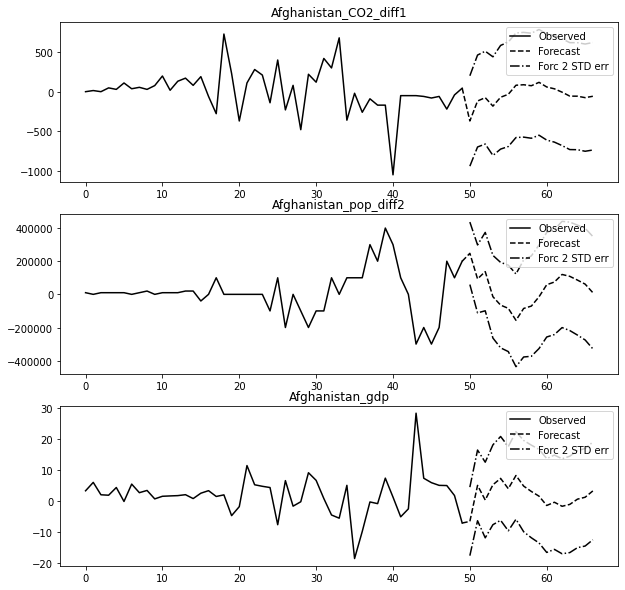

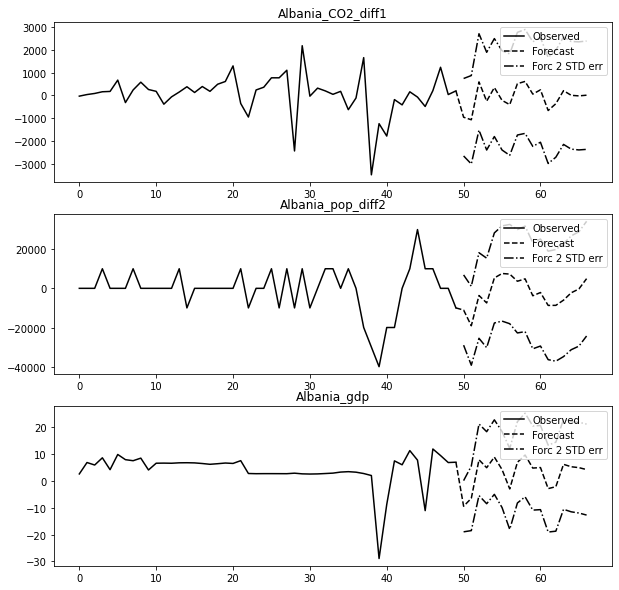

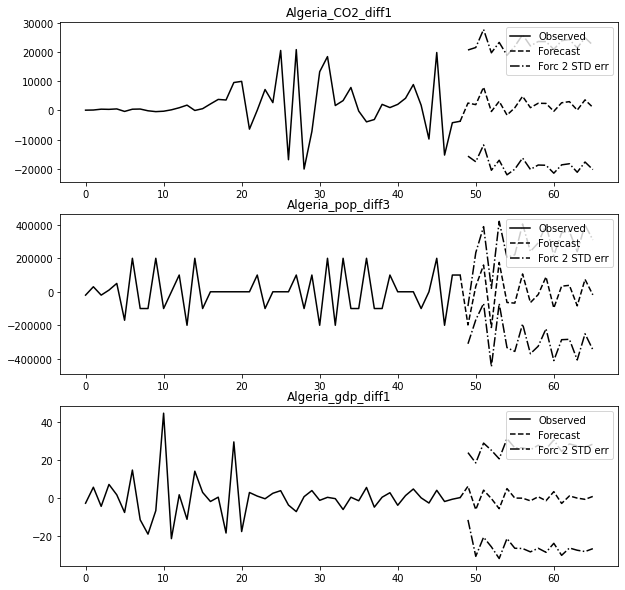

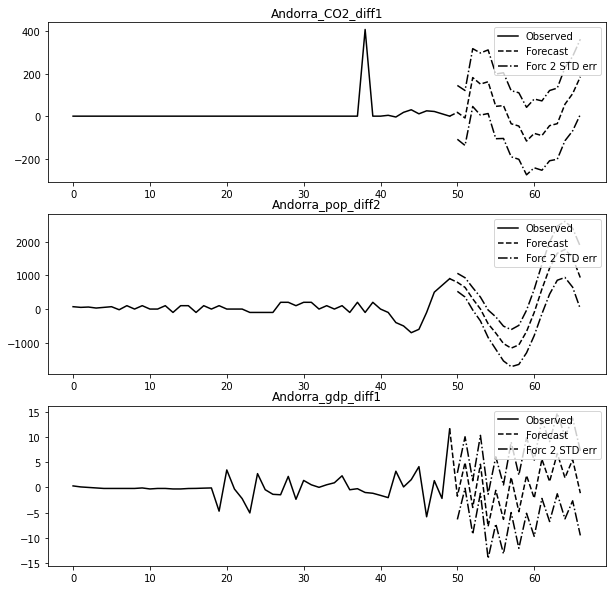

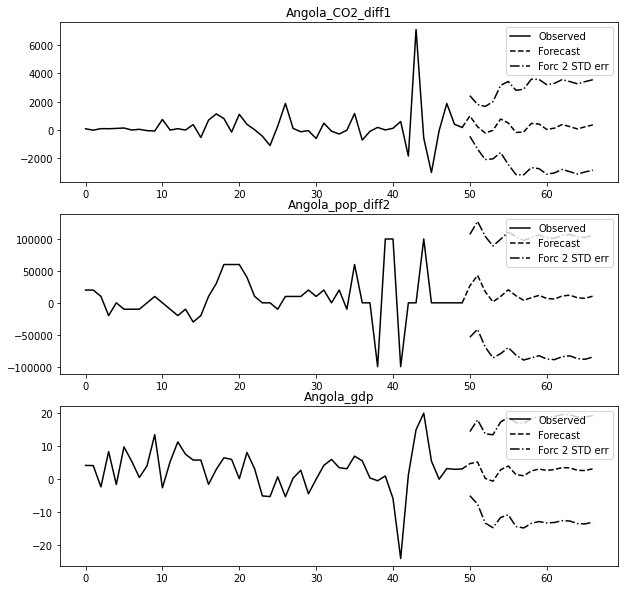

...

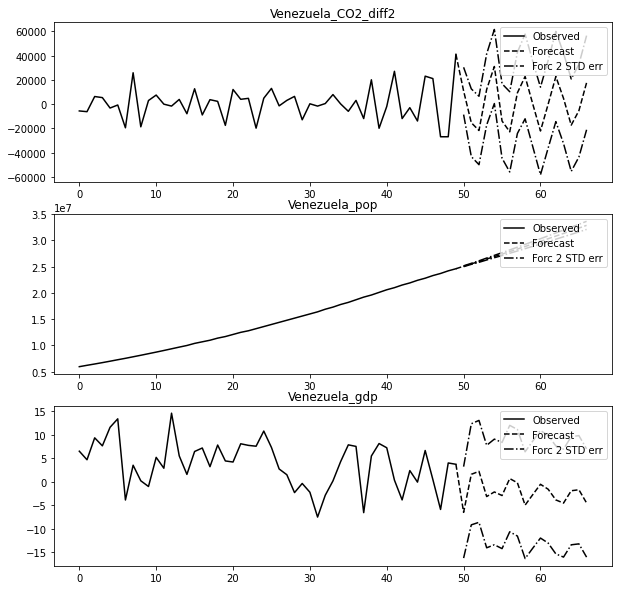

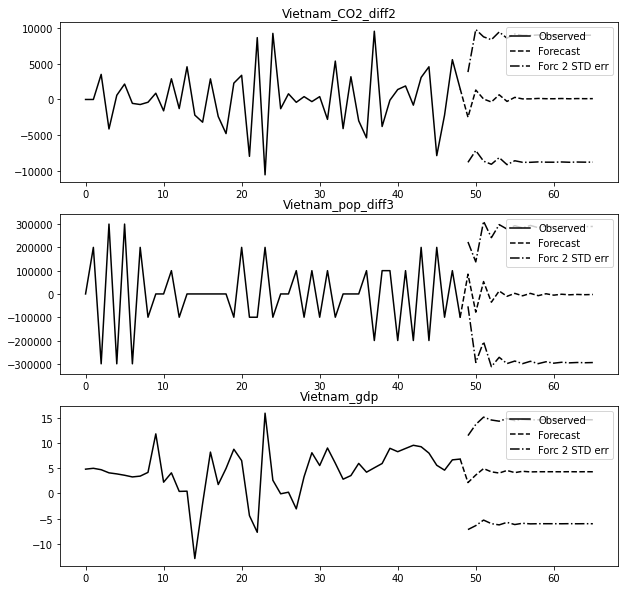

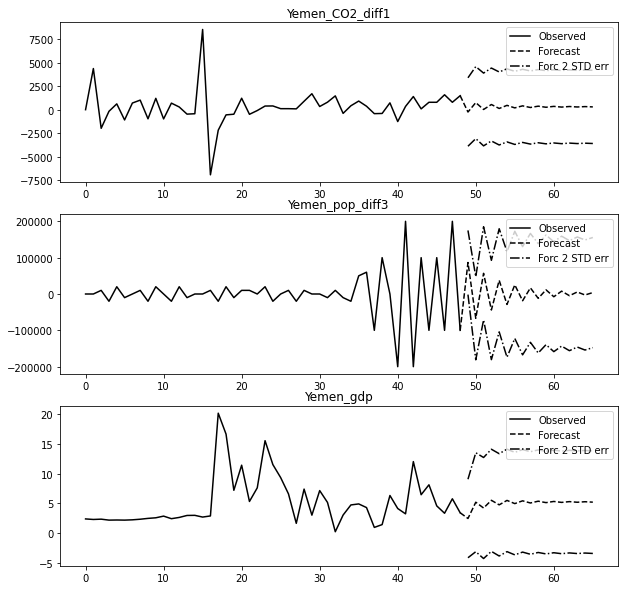

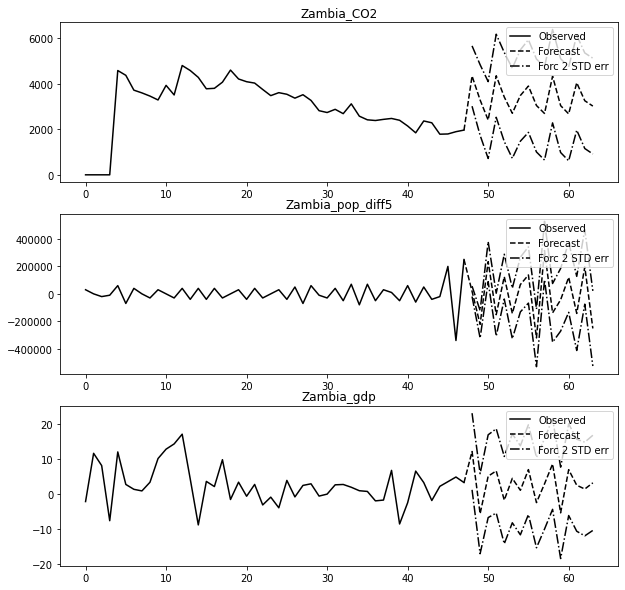

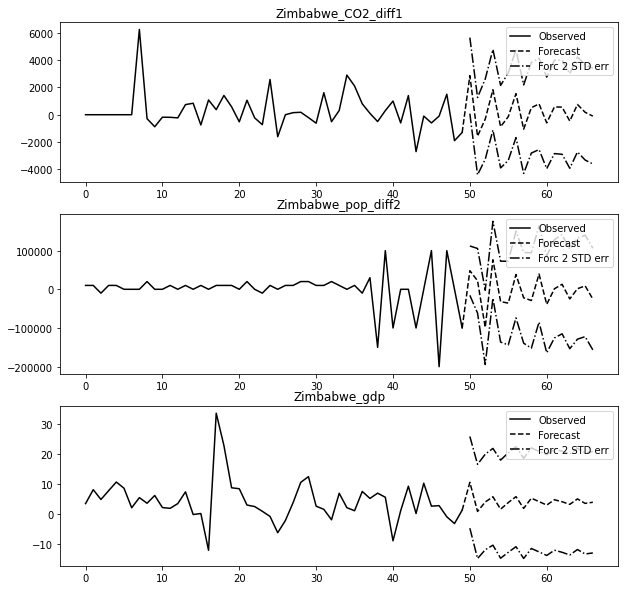

In [17]:
for index, row in countries.iterrows():
    try:
        country_name = str(index)
        country_name = VAR_model(str(index), 20)
        country_name.setup()
        country_name.train_model_fit()
        row['mse_CO2'] = country_name.mse_CO2
        row['r2_score_CO2'] = country_name.r2_score_CO2
        row['mse_pop'] = country_name.mse_pop
        row['r2_score_pop'] = country_name.r2_score_pop
        row['mse_gdp'] = country_name.mse_gdp
        row['r2_score_gdp'] = country_name.r2_score_gdp
        #country_name.model_fit()
    except:
        pass 

In [18]:
countries[(countries['mse_CO2'] == 0)] #change to time lags to 10 to get additional models 

,mse_CO2,r2_score_CO2,mse_pop,r2_score_pop,mse_gdp,r2_score_gdp
country_names,,,,,,
Antigua and Barbuda,0,0,0,0,0,0
Bahrain,0,0,0,0,0,0
Barbados,0,0,0,0,0,0
Central African Republic,0,0,0,0,0,0
"Congo, Dem. Rep.",0,0,0,0,0,0
Luxembourg,0,0,0,0,0,0
New Zealand,0,0,0,0,0,0
Singapore,0,0,0,0,0,0
Timor-Leste,0,0,0,0,0,0


In [19]:
countries #can use this to show which models need additional tuning

,mse_CO2,r2_score_CO2,mse_pop,r2_score_pop,mse_gdp,r2_score_gdp
country_names,,,,,,
Afghanistan,1962598,0,18717382633,0,118,0
Albania,598327,-3,137937467,0,37,-5
Algeria,58055678,0,16853383392,0,10,-3
Andorra,9419,-43,505387,-1,27,-1
Angola,21864499,0,5693929194,0,87,0
Antigua and Barbuda,0,0,0,0,0,0
Argentina,143251750,0,3185010789,0,29,0
Armenia,489850,0,94937649,0,57,0
Australia,35841158,0,5381448913,0,1,0
